In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!ls -lh "/content/drive/MyDrive/Thomas"

total 11G
-rw------- 1 root root 11G Jan 11 22:53 CheXpert_Thomas.zip


**Workspace**

In [ ]:
!rm -rf /content/chexpert
!mkdir -p /content/chexpert


**Unzip into Colab’s working disk**

In [ ]:
!unzip -q "/content/drive/MyDrive/Thomas/CheXpert_Thomas.zip" -d /content/chexpert


**Verify extraction**

In [ ]:
!ls -lah /content/chexpert | head -n 40


total 26M
drwxr-xr-x     4 root root 4.0K Jan 12 13:47 .
drwxr-xr-x     1 root root 4.0K Jan 12 13:42 ..
drwxr-xr-x 64542 root root 1.9M Jan 12 13:47 train
-rw-r--r--     1 root root  24M Apr 28  2021 train.csv
drwxr-xr-x   202 root root 4.0K Jan 12 13:47 valid
-rw-r--r--     1 root root  33K Apr 28  2021 valid.csv


In [ ]:
!find /content/chexpert -maxdepth 4 -type f -name "*.csv" | head -n 20


/content/chexpert/valid.csv
/content/chexpert/train.csv


In [ ]:
!find /content/chexpert -maxdepth 4 -type f \( -name "*.jpg" -o -name "*.png" \) | head -n 10


/content/chexpert/train/patient61594/study1/view1_frontal.jpg
/content/chexpert/train/patient61595/study1/view1_frontal.jpg
/content/chexpert/train/patient61596/study1/view1_frontal.jpg
/content/chexpert/train/patient61597/study1/view1_frontal.jpg
/content/chexpert/train/patient61598/study1/view1_frontal.jpg
/content/chexpert/train/patient61599/study1/view1_frontal.jpg
/content/chexpert/train/patient61600/study1/view1_frontal.jpg
/content/chexpert/train/patient61601/study1/view1_frontal.jpg
/content/chexpert/train/patient61602/study1/view1_frontal.jpg
/content/chexpert/train/patient61603/study1/view1_frontal.jpg


**A) Setup: load CSVs and define labels**

Cell A1: Imports + paths

In [ ]:
import pandas as pd
import numpy as np
from pathlib import Path

DATA_ROOT = Path("/content/chexpert")
TRAIN_CSV = DATA_ROOT / "train.csv"
VALID_CSV = DATA_ROOT / "valid.csv"

train_df = pd.read_csv(TRAIN_CSV)
valid_df = pd.read_csv(VALID_CSV)

print("Train rows:", len(train_df))
print("Valid rows:", len(valid_df))
train_df.head(2)


Train rows: 223414
Valid rows: 234


,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,Edema,Consolidation,Pneumonia,Atelectasis,Pneumothorax,Pleural Effusion,Pleural Other,Fracture,Support Devices
0,CheXpert-v1.0-small/train/patient00001/study1/...,Female,68,Frontal,AP,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,1.0
1,CheXpert-v1.0-small/train/patient00002/study2/...,Female,87,Frontal,AP,NaN,NaN,-1.0,1.0,NaN,-1.0,-1.0,NaN,-1.0,NaN,-1.0,NaN,1.0,NaN


from matplotlib import pyplot as plt
_df_0['Age'].plot(kind='hist', bins=20, title='Age')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['No Finding'].plot(kind='hist', bins=20, title='No Finding')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['Cardiomegaly'].plot(kind='hist', bins=20, title='Cardiomegaly')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['Lung Opacity'].plot(kind='hist', bins=20, title='Lung Opacity')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_4.groupby('Path').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='Age', y='No Finding', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='No Finding', y='Cardiomegaly', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7.plot(kind='scatter', x='Cardiomegaly', y='Lung Opacity', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_8.plot(kind='scatter', x='Lung Opacity', y='Edema', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Age']
  ys = series['No Finding']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_9.sort_values('Age', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Path')):
  _plot_series(series, series_name, i)
  fig.legend(title='Path', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Age')
_ = plt.ylabel('No Finding')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Age']
  ys = series['Cardiomegaly']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_10.sort_values('Age', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Path')):
  _plot_series(series, series_name, i)
  fig.legend(title='Path', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Age')
_ = plt.ylabel('Cardiomegaly')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Age']
  ys = series['Lung Opacity']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_11.sort_values('Age', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Path')):
  _plot_series(series, series_name, i)
  fig.legend(title='Path', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Age')
_ = plt.ylabel('Lung Opacity')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Age']
  ys = series['Edema']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_12.sort_values('Age', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Path')):
  _plot_series(series, series_name, i)
  fig.legend(title='Path', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Age')
_ = plt.ylabel('Edema')

from matplotlib import pyplot as plt
_df_13['Age'].plot(kind='line', figsize=(8, 4), title='Age')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_14['No Finding'].plot(kind='line', figsize=(8, 4), title='No Finding')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_15['Cardiomegaly'].plot(kind='line', figsize=(8, 4), title='Cardiomegaly')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_16['Lung Opacity'].plot(kind='line', figsize=(8, 4), title='Lung Opacity')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_17['Path'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_17, x='Age', y='Path', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_18['Path'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_18, x='No Finding', y='Path', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_19['Path'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_19, x='Cardiomegaly', y='Path', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_20['Path'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_20, x='Lung Opacity', y='Path', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

Cell A2: Define the CheXpert label set

In [ ]:
CHEXPERT_LABELS = [
    "Atelectasis","Cardiomegaly","Consolidation","Edema","Enlarged Cardiomediastinum",
    "Fracture","Lung Lesion","Lung Opacity","Pleural Effusion","Pleural Other",
    "Pneumonia","Pneumothorax","Support Devices","No Finding"
]

missing_train = [c for c in CHEXPERT_LABELS if c not in train_df.columns]
missing_valid = [c for c in CHEXPERT_LABELS if c not in valid_df.columns]
print("Missing in train:", missing_train)
print("Missing in valid:", missing_valid)


Missing in train: []
Missing in valid: []


**B) Section 4.1 core outputs**

.1.1 Dataset composition table (images + patients)
Cell B1: extract patient ID from path

In [ ]:
import re

def extract_patient_id(path_str: str):
    m = re.search(r"(patient\d+)", str(path_str))
    return m.group(1) if m else None

train_df["patient_id"] = train_df["Path"].apply(extract_patient_id)
valid_df["patient_id"] = valid_df["Path"].apply(extract_patient_id)

print("Unique train patients:", train_df["patient_id"].nunique())
print("Unique valid patients:", valid_df["patient_id"].nunique())


Unique train patients: 64540
Unique valid patients: 200


Cell B2: build dataset composition summary

In [ ]:
composition = pd.DataFrame({
    "Split": ["Train", "Validation"],
    "Images (rows)": [len(train_df), len(valid_df)],
    "Unique patients": [train_df["patient_id"].nunique(), valid_df["patient_id"].nunique()],
    "Unique studies (approx)": [train_df["Path"].str.extract(r"(study\d+)")[0].nunique(),
                               valid_df["Path"].str.extract(r"(study\d+)")[0].nunique()],
})
composition


,Split,Images (rows),Unique patients,Unique studies (approx)
0,Train,223414,64540,91
1,Validation,234,200,1


from matplotlib import pyplot as plt
composition['Images (rows)'].plot(kind='hist', bins=20, title='Images (rows)')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
composition['Unique patients'].plot(kind='hist', bins=20, title='Unique patients')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
composition['Unique studies (approx)'].plot(kind='hist', bins=20, title='Unique studies (approx)')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
composition.groupby('Split').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
composition.plot(kind='scatter', x='Images (rows)', y='Unique patients', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
composition.plot(kind='scatter', x='Unique patients', y='Unique studies (approx)', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
composition['Images (rows)'].plot(kind='line', figsize=(8, 4), title='Images (rows)')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
composition['Unique patients'].plot(kind='line', figsize=(8, 4), title='Unique patients')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
composition['Unique studies (approx)'].plot(kind='line', figsize=(8, 4), title='Unique studies (approx)')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(composition['Split'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(composition, x='Images (rows)', y='Split', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(composition['Split'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(composition, x='Unique patients', y='Split', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(composition['Split'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(composition, x='Unique studies (approx)', y='Split', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

**4.1.2 Class prevalence and imbalance table**

Cell B3: prevalence by label

In [ ]:
def prevalence_table(df, labels):
    out = []
    for lab in labels:
        s = df[lab]
        n = len(s)
        pos = (s == 1).sum()
        unc = (s == -1).sum()
        neg = (s == 0).sum()
        out.append({
            "Label": lab,
            "Pos (1)": int(pos),
            "Uncertain (-1)": int(unc),
            "Neg (0)": int(neg),
            "Pos% (1 only)": round(pos / n * 100, 2),
            "Pos% (1 or -1)": round((pos + unc) / n * 100, 2),
        })
    return pd.DataFrame(out).sort_values("Pos% (1 or -1)", ascending=False)

train_prev = prevalence_table(train_df, CHEXPERT_LABELS)
valid_prev = prevalence_table(valid_df, CHEXPERT_LABELS)

train_prev.head(10)


,Label,Pos (1),Uncertain (-1),Neg (0),Pos% (1 only),Pos% (1 or -1)
12,Support Devices,116001,1079,6137,51.92,52.40
7,Lung Opacity,105581,5598,6599,47.26,49.76
8,Pleural Effusion,86187,11628,35396,38.58,43.78
0,Atelectasis,33376,33739,1328,14.94,30.04
3,Edema,52246,12984,20726,23.39,29.20
2,Consolidation,14783,27742,28097,6.62,19.03
1,Cardiomegaly,27000,8087,11116,12.09,15.70
10,Pneumonia,6039,18770,2799,2.70,11.10
4,Enlarged Cardiomediastinum,10798,12403,21638,4.83,10.38
11,Pneumothorax,19448,3145,56341,8.70,10.11


from matplotlib import pyplot as plt
_df_21['Pos (1)'].plot(kind='hist', bins=20, title='Pos (1)')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_22['Uncertain (-1)'].plot(kind='hist', bins=20, title='Uncertain (-1)')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_23['Neg (0)'].plot(kind='hist', bins=20, title='Neg (0)')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_24['Pos% (1 only)'].plot(kind='hist', bins=20, title='Pos% (1 only)')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_25.plot(kind='scatter', x='Pos (1)', y='Uncertain (-1)', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_26.plot(kind='scatter', x='Uncertain (-1)', y='Neg (0)', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_27.plot(kind='scatter', x='Neg (0)', y='Pos% (1 only)', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_28.plot(kind='scatter', x='Pos% (1 only)', y='Pos% (1 or -1)', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_29['Pos (1)'].plot(kind='line', figsize=(8, 4), title='Pos (1)')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_30['Uncertain (-1)'].plot(kind='line', figsize=(8, 4), title='Uncertain (-1)')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_31['Neg (0)'].plot(kind='line', figsize=(8, 4), title='Neg (0)')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_32['Pos% (1 only)'].plot(kind='line', figsize=(8, 4), title='Pos% (1 only)')
plt.gca().spines[['top', 'right']].set_visible(False)

Cell B4: view imbalance extremes

In [ ]:
train_prev.tail(10)


,Label,Pos (1),Uncertain (-1),Neg (0),Pos% (1 only),Pos% (1 or -1)
3,Edema,52246,12984,20726,23.39,29.20
2,Consolidation,14783,27742,28097,6.62,19.03
1,Cardiomegaly,27000,8087,11116,12.09,15.70
10,Pneumonia,6039,18770,2799,2.70,11.10
4,Enlarged Cardiomediastinum,10798,12403,21638,4.83,10.38
11,Pneumothorax,19448,3145,56341,8.70,10.11
13,No Finding,22381,0,0,10.02,10.02
6,Lung Lesion,9186,1488,1270,4.11,4.78
5,Fracture,9040,642,2512,4.05,4.33
9,Pleural Other,3523,2653,316,1.58,2.76


from matplotlib import pyplot as plt
_df_33['Pos (1)'].plot(kind='hist', bins=20, title='Pos (1)')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_34['Uncertain (-1)'].plot(kind='hist', bins=20, title='Uncertain (-1)')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_35['Neg (0)'].plot(kind='hist', bins=20, title='Neg (0)')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_36['Pos% (1 only)'].plot(kind='hist', bins=20, title='Pos% (1 only)')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_37.plot(kind='scatter', x='Pos (1)', y='Uncertain (-1)', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_38.plot(kind='scatter', x='Uncertain (-1)', y='Neg (0)', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_39.plot(kind='scatter', x='Neg (0)', y='Pos% (1 only)', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_40.plot(kind='scatter', x='Pos% (1 only)', y='Pos% (1 or -1)', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_41['Pos (1)'].plot(kind='line', figsize=(8, 4), title='Pos (1)')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_42['Uncertain (-1)'].plot(kind='line', figsize=(8, 4), title='Uncertain (-1)')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_43['Neg (0)'].plot(kind='line', figsize=(8, 4), title='Neg (0)')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_44['Pos% (1 only)'].plot(kind='line', figsize=(8, 4), title='Pos% (1 only)')
plt.gca().spines[['top', 'right']].set_visible(False)

**4.1.3 Split integrity and leakage checks (patient-level)**

Cell B5: patient overlap check

In [ ]:
train_patients = set(train_df["patient_id"].dropna().unique())
valid_patients = set(valid_df["patient_id"].dropna().unique())
overlap = train_patients.intersection(valid_patients)

print("Train patients:", len(train_patients))
print("Valid patients:", len(valid_patients))
print("Overlap patients:", len(overlap))

list(overlap)[:10]


Train patients: 64540
Valid patients: 200
Overlap patients: 0


[]

**4.1.4 Sanity check: image path resolution**

Cell B6: path existence check

In [ ]:
def to_abs_path(p):
    # Paths in CSV are typically like "train/patient.../study.../view....jpg"
    return DATA_ROOT / str(p)

sample_paths = train_df["Path"].sample(20, random_state=42).tolist()
exists = [to_abs_path(p).exists() for p in sample_paths]

print("Existing files in sample:", sum(exists), "/", len(exists))
print("Example absolute path:", to_abs_path(sample_paths[0]))


Existing files in sample: 0 / 20
Example absolute path: /content/chexpert/CheXpert-v1.0-small/train/patient00082/study1/view1_frontal.jpg


**Existing files in sample: 0 / 20 instead of 20/20 so we use new approach here**

In [ ]:
!ls -lah /content/chexpert | head -n 50


total 26M
drwxr-xr-x     4 root root 4.0K Jan 12 13:47 .
drwxr-xr-x     1 root root 4.0K Jan 12 13:42 ..
drwxr-xr-x 64542 root root 1.9M Jan 12 13:47 train
-rw-r--r--     1 root root  24M Apr 28  2021 train.csv
drwxr-xr-x   202 root root 4.0K Jan 12 13:47 valid
-rw-r--r--     1 root root  33K Apr 28  2021 valid.csv


**Fix the path resolver**

In [ ]:
from pathlib import Path

DATA_ROOT = Path("/content/chexpert")

def to_abs_path(p):
    # CSV paths start with "CheXpert-v1.0-small/..."
    p = str(p)
    if p.startswith("CheXpert-v1.0-small/"):
        p = p.replace("CheXpert-v1.0-small/", "")
    return DATA_ROOT / p


**Re-running Sanity Check**

In [ ]:
sample_paths = train_df["Path"].sample(20, random_state=42).tolist()
exists = [to_abs_path(p).exists() for p in sample_paths]

print("Existing files in sample:", sum(exists), "/", len(exists))
print("Example absolute path:", to_abs_path(sample_paths[0]))


Existing files in sample: 20 / 20
Example absolute path: /content/chexpert/train/patient00082/study1/view1_frontal.jpg


**Step 2 — Create labels**

The following goes directly into 4.1 Experimental context.

In [ ]:
import pandas as pd

train_df = pd.read_csv("/content/chexpert/train.csv")
valid_df = pd.read_csv("/content/chexpert/valid.csv")

# Keep only frontal images
train_df = train_df[train_df["Frontal/Lateral"] == "Frontal"]
valid_df = valid_df[valid_df["Frontal/Lateral"] == "Frontal"]

# Binary pneumonia label
def clean_label(x):
    if x == 1:
        return 1
    if x == 0:
        return 0
    return None  # uncertain or missing → drop

train_df["Pneumonia"] = train_df["Pneumonia"].apply(clean_label)
valid_df["Pneumonia"] = valid_df["Pneumonia"].apply(clean_label)

train_df = train_df.dropna(subset=["Pneumonia"])
valid_df = valid_df.dropna(subset=["Pneumonia"])

print("Train size:", len(train_df))
print("Valid size:", len(valid_df))
print("Positive rate:", train_df["Pneumonia"].mean())


Train size: 6550
Valid size: 202
Positive rate: 0.7137404580152672


**Step 3 — Define the dataset loader**

In [ ]:
from torch.utils.data import Dataset
from PIL import Image
import torch
from torchvision import transforms
from pathlib import Path

DATA_ROOT = Path("/content/chexpert")

transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5],[0.5])
])

class CheXpertDataset(Dataset):
    def __init__(self, df):
        self.df = df.reset_index(drop=True)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = DATA_ROOT / row["Path"]
        image = Image.open(img_path).convert("L")
        image = transform(image)
        label = torch.tensor(row["Pneumonia"], dtype=torch.float32)
        return image, label


**Step 4 — Create train and validation loaders**

In [ ]:
from torch.utils.data import DataLoader

train_ds = CheXpertDataset(train_df)
valid_ds = CheXpertDataset(valid_df)

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
valid_loader = DataLoader(valid_ds, batch_size=32, shuffle=False)


**Step 5 — Build the baseline CNN (RO1)**

In [ ]:
import torch.nn as nn
import torchvision.models as models
import torch

# Define the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet18(pretrained=True)
model.conv1 = nn.Conv2d(1,64,kernel_size=7,stride=2,padding=3,bias=False)
model.fc = nn.Linear(model.fc.in_features, 1)

# Move the model to the selected device
model = model.to(device)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loss and optimizer:

In [ ]:
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)


**GPU Enabled or not checking**

In [ ]:
import torch
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "NO GPU")


False
NO GPU


In [ ]:
import torch
torch.cuda.is_available()


True

In [ ]:
!nvidia-smi


Mon Jan 12 18:59:51 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   42C    P8             10W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import torch
print("CUDA:", torch.cuda.is_available())
print("Device:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")


CUDA: True
Device: Tesla T4


**Step 0 — One-time setup cell (run first)**

In [ ]:
# ====== 0) Reproducible setup ======
import os, random, numpy as np
import torch

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = False   # faster, acceptable for DL experiments
torch.backends.cudnn.benchmark = True        # faster on fixed image sizes

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


Device: cuda


**Step 1 — Define dataset root and load CSVs**

Troubleshooting, dont include in the final version

In [ ]:
!pwd
!ls -lah /content | head -n 100


/content
total 16K
drwxr-xr-x 1 root root 4.0K Dec  9 14:41 .
drwxr-xr-x 1 root root 4.0K Jan 12 18:50 ..
drwxr-xr-x 4 root root 4.0K Dec  9 14:41 .config
drwxr-xr-x 1 root root 4.0K Dec  9 14:42 sample_data


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!ls -lah "/content/drive/MyDrive" | head -n 50
!ls -lah "/content/drive/MyDrive/Thomas" | head -n 50


total 74M
-rw------- 1 root root  175 Jan 12 08:52 💡 100 UI UX Portfolios from Designers at Google, Meta, Netflix & More.gdoc
-rw------- 1 root root 771K Oct 30  2023 10_b DE MV Nuernberg final.docx.pdf
-rw------- 1 root root  175 Aug 16  2024 Abhishek Thesis.gdoc
-rw------- 1 root root  175 Jun 21  2024 Aditya PML.gdoc
-rw------- 1 root root  175 Jul 13  2024 Agyapal Thesis.gdoc
-rw------- 1 root root  175 Dec 14 07:29 AI_Generalist_Roadmap.gdoc
-rw------- 1 root root 1.1M Feb  5  2025 AIPRAC.ipynb
-rw------- 1 root root  175 Nov 11  2024 Akansha Term Paper (1).gdoc
-rw------- 1 root root  175 Apr 25  2025 Akansha Term Paper.gdoc
-rw------- 1 root root  175 Sep  4 13:37 Akansha Thesis.gdoc
-rw------- 1 root root  175 May 24  2025 Akansha TP 2.gdoc
-rw------- 1 root root  175 Oct  3 17:27 AKHIL 0310 F1.gdoc
-rw------- 1 root root  175 Jun 15  2025 Akhil F1 1506.gdoc
-rw------- 1 root root  175 Oct 18 23:52 AKHIL F2 1910.gdoc
-rw------- 1 root root  175 Feb 12  2025 Akhil F2.gdoc
-rw---

In [ ]:
!mkdir -p /content/chexpert
!unzip -q "/content/drive/MyDrive/Thomas/CheXpert_Thomas.zip" -d /content/chexpert


In [ ]:
!ls -lah /content/chexpert | head -n 50


total 26M
drwxr-xr-x     4 root root 4.0K Jan 12 19:26 .
drwxr-xr-x     1 root root 4.0K Jan 12 19:22 ..
drwxr-xr-x 64542 root root 1.9M Jan 12 19:26 train
-rw-r--r--     1 root root  24M Apr 28  2021 train.csv
drwxr-xr-x   202 root root 4.0K Jan 12 19:26 valid
-rw-r--r--     1 root root  33K Apr 28  2021 valid.csv


In [ ]:
from pathlib import Path
import pandas as pd

DATA_ROOT = Path("/content/chexpert")
train_df = pd.read_csv(DATA_ROOT / "train.csv")
valid_df = pd.read_csv(DATA_ROOT / "valid.csv")

print("train:", train_df.shape, "| valid:", valid_df.shape)
print("Columns:", train_df.columns.tolist())
train_df.head(2)


train: (223414, 19) | valid: (234, 19)
Columns: ['Path', 'Sex', 'Age', 'Frontal/Lateral', 'AP/PA', 'No Finding', 'Enlarged Cardiomediastinum', 'Cardiomegaly', 'Lung Opacity', 'Lung Lesion', 'Edema', 'Consolidation', 'Pneumonia', 'Atelectasis', 'Pneumothorax', 'Pleural Effusion', 'Pleural Other', 'Fracture', 'Support Devices']


,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,Edema,Consolidation,Pneumonia,Atelectasis,Pneumothorax,Pleural Effusion,Pleural Other,Fracture,Support Devices
0,CheXpert-v1.0-small/train/patient00001/study1/...,Female,68,Frontal,AP,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,1.0
1,CheXpert-v1.0-small/train/patient00002/study2/...,Female,87,Frontal,AP,NaN,NaN,-1.0,1.0,NaN,-1.0,-1.0,NaN,-1.0,NaN,-1.0,NaN,1.0,NaN


In [ ]:
from pathlib import Path

def to_abs_path(p):
    return DATA_ROOT / str(p)

sample_paths = train_df["Path"].sample(20, random_state=42).tolist()
exists = [to_abs_path(p).exists() for p in sample_paths]

print("Existing files in sample:", sum(exists), "/", len(exists))
print("Example absolute path:", to_abs_path(sample_paths[0]))


Existing files in sample: 0 / 20
Example absolute path: /content/chexpert/CheXpert-v1.0-small/train/patient00082/study1/view1_frontal.jpg


In [ ]:
from pathlib import Path

DATA_ROOT = Path("/content/chexpert")

def resolve_path(p):
    p = str(p).replace("\\", "/")
    if p.startswith("CheXpert-v1.0-small/"):
        p = p.replace("CheXpert-v1.0-small/", "", 1)
    return DATA_ROOT / p


In [ ]:
sample_paths = train_df["Path"].sample(20, random_state=42).tolist()
exists = [resolve_path(p).exists() for p in sample_paths]

print("Existing files in sample:", sum(exists), "/", len(exists))
print("Example absolute path:", resolve_path(sample_paths[0]))


Existing files in sample: 20 / 20
Example absolute path: /content/chexpert/train/patient00082/study1/view1_frontal.jpg


**Step 4.1.1 — Path normalisation (run this)**

In [ ]:
from pathlib import Path

DATA_ROOT = Path("/content/chexpert")

def resolve_path(p):
    p = str(p).replace("\\", "/")
    if p.startswith("CheXpert-v1.0-small/"):
        p = p.replace("CheXpert-v1.0-small/", "", 1)
    return DATA_ROOT / p


In [ ]:
sample_paths = train_df["Path"].sample(20, random_state=42).tolist()
exists = [resolve_path(p).exists() for p in sample_paths]

print("Existing files in sample:", sum(exists), "/", len(exists))
print("Example absolute path:", resolve_path(sample_paths[0]))


Existing files in sample: 20 / 20
Example absolute path: /content/chexpert/train/patient00082/study1/view1_frontal.jpg


**STAGE 4.1.3 – Label Structure, Prevalence, and Class Imbalance**

**Step 4.1.3.1 – Select the diagnostic labels**

In [ ]:
LABELS = ["Atelectasis","Cardiomegaly","Consolidation","Edema","Pleural Effusion"]


In [ ]:
missing = [c for c in LABELS if c not in train_df.columns]
print("Missing labels:", missing)


Missing labels: []


**Step 4.1.3.2 – Apply uncertainty handling policy**

In [ ]:
import numpy as np

def clean_labels(df, labels):
    y = df[labels].copy()
    y = y.fillna(0)
    y = y.replace(-1, 0)
    return y.astype(np.float32)

train_df[LABELS] = clean_labels(train_df, LABELS)
valid_df[LABELS] = clean_labels(valid_df, LABELS)


**Step 4.1.3.3 – Compute prevalence (IMPORTANT)**

In [ ]:
prevalence = train_df[LABELS].mean().sort_values(ascending=False)
prevalence_df = prevalence.reset_index()
prevalence_df.columns = ["Condition","Prevalence"]
prevalence_df


,Condition,Prevalence
0,Pleural Effusion,0.385773
1,Edema,0.233853
2,Atelectasis,0.149391
3,Cardiomegaly,0.120852
4,Consolidation,0.066169


**STAGE 4.2 – Research Objective 1 (Baseline Diagnostic Performance):::::**

**STAGE 4.2.1 — Fix Label Dtypes Before Training**

Step 1: Force labels to numeric

In [ ]:
import numpy as np
import pandas as pd

for c in LABELS:
    train_df[c] = pd.to_numeric(train_df[c], errors="coerce")
    valid_df[c] = pd.to_numeric(valid_df[c], errors="coerce")

# Now apply your uncertainty policy again (safe)
train_df[LABELS] = train_df[LABELS].fillna(0).replace(-1, 0).astype(np.float32)
valid_df[LABELS] = valid_df[LABELS].fillna(0).replace(-1, 0).astype(np.float32)

print(train_df[LABELS].dtypes)
print(valid_df[LABELS].dtypes)


Atelectasis         float32
Cardiomegaly        float32
Consolidation       float32
Edema               float32
Pleural Effusion    float32
dtype: object
Atelectasis         float32
Cardiomegaly        float32
Consolidation       float32
Edema               float32
Pleural Effusion    float32
dtype: object


In [ ]:
bad = {}
for c in LABELS:
    bad[c] = train_df[c].isna().sum()
print("NaN counts:", bad)
print("Unique values sample:", {c: train_df[c].dropna().unique()[:5] for c in LABELS})


NaN counts: {'Atelectasis': np.int64(0), 'Cardiomegaly': np.int64(0), 'Consolidation': np.int64(0), 'Edema': np.int64(0), 'Pleural Effusion': np.int64(0)}
Unique values sample: {'Atelectasis': array([0., 1.], dtype=float32), 'Cardiomegaly': array([0., 1.], dtype=float32), 'Consolidation': array([0., 1.], dtype=float32), 'Edema': array([0., 1.], dtype=float32), 'Pleural Effusion': array([0., 1.], dtype=float32)}


In [ ]:
def __getitem__(self, idx):
    row = self.df.iloc[idx]
    img = Image.open(resolve_path(row["Path"])).convert("RGB")
    x = self.transform(img)
    y = torch.from_numpy(row[self.labels].to_numpy(dtype=np.float32))
    return x, y


**Step 4: Recreate DataLoaders with num_workers=0 temporarily**

In [ ]:
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image

class CheXpertDataset(Dataset):
    def __init__(self, df, labels, transform):
        self.df = df.reset_index(drop=True)
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(resolve_path(row["Path"])).convert("RGB")
        x = self.transform(img)

        # ✅ Force numeric float32 conversion regardless of pandas dtype
        y = row[self.labels].to_numpy(dtype=np.float32)
        y = torch.from_numpy(y)

        return x, y


Step 2) Recreate the dataset objects

In [ ]:
train_ds = CheXpertDataset(train_df, LABELS, train_tfms)
valid_ds = CheXpertDataset(valid_df, LABELS, valid_tfms)


NameError: name 'train_df' is not defined

**RUNTIME RECONNECTED SETUP AGAIN**

In [ ]:
!find /content -type f -name "train.csv"


In [ ]:
!find /content -type f -name "valid.csv"


STAGE 4.1B — Set DATA_ROOT from the truth (runtime-safe)

✅ Cell 1: Confirm file locations again (no assumptions)

In [ ]:
!ls -lah /content/chexpert | head -n 50
!find /content -type f -name "train.csv" | head -n 10
!find /content -type f -name "valid.csv" | head -n 10


ls: cannot access '/content/chexpert': No such file or directory


**RECONNECT SETUP AFTER BREAK**

In [ ]:
import torch
print("CUDA:", torch.cuda.is_available())
print("Device:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")


CUDA: True
Device: Tesla T4


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!find /content/drive/MyDrive -type f -iname "CheXpert_Thomas.zip" | head -n 20


/content/drive/MyDrive/Thomas/CheXpert_Thomas.zip


In [ ]:
ZIP_PATH="/content/drive/MyDrive/Thomas/CheXpert_Thomas.zip"
print(ZIP_PATH)


/content/drive/MyDrive/Thomas/CheXpert_Thomas.zip


In [ ]:
!rm -rf /content/chexpert
!mkdir -p /content/chexpert
!unzip -q "$ZIP_PATH" -d /content/chexpert


In [ ]:
!ls -lah /content/chexpert | head -n 50


total 26M
drwxr-xr-x     4 root root 4.0K Jan 12 21:19 .
drwxr-xr-x     1 root root 4.0K Jan 12 21:15 ..
drwxr-xr-x 64542 root root 1.9M Jan 12 21:19 train
-rw-r--r--     1 root root  24M Apr 28  2021 train.csv
drwxr-xr-x   202 root root 4.0K Jan 12 21:19 valid
-rw-r--r--     1 root root  33K Apr 28  2021 valid.csv


In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np

DATA_ROOT = Path("/content/chexpert")
train_df = pd.read_csv(DATA_ROOT/"train.csv")
valid_df = pd.read_csv(DATA_ROOT/"valid.csv")

print("train:", train_df.shape, "valid:", valid_df.shape)
print("Columns:", train_df.columns[:10].tolist())


train: (223414, 19) valid: (234, 19)
Columns: ['Path', 'Sex', 'Age', 'Frontal/Lateral', 'AP/PA', 'No Finding', 'Enlarged Cardiomediastinum', 'Cardiomegaly', 'Lung Opacity', 'Lung Lesion']


In [ ]:
def resolve_path(rel_path: str):
    rel_path = str(rel_path).replace("\\","/")
    # if CSV includes wrapper prefix, strip it safely
    if rel_path.startswith("CheXpert-v1.0-small/"):
        rel_path = rel_path.replace("CheXpert-v1.0-small/","",1)
    return DATA_ROOT / rel_path


In [ ]:
sample_paths = train_df["Path"].sample(20, random_state=42).tolist()
exists = [resolve_path(p).exists() for p in sample_paths]
print("Existing files in sample:", sum(exists), "/", len(exists))
print("Example:", resolve_path(sample_paths[0]))


Existing files in sample: 20 / 20
Example: /content/chexpert/train/patient00082/study1/view1_frontal.jpg


**STAGE 3 — Fix labels (this prevents numpy.object_ forever)**
Cell 3.1: Choose labels (5-pathology subset)

In [ ]:
LABELS = ["Atelectasis","Cardiomegaly","Consolidation","Edema","Pleural Effusion"]
missing = [c for c in LABELS if c not in train_df.columns]
print("Missing labels:", missing)


Missing labels: []


Cell 3.2: Force numeric + apply U-Zeros policy (-1 → 0, NaN → 0)

In [ ]:
def clean_labels(df, labels):
    df = df.copy()
    for c in labels:
        df[c] = pd.to_numeric(df[c], errors="coerce")
        df[c] = df[c].fillna(0.0)
        df[c] = df[c].replace(-1.0, 0.0)
        df[c] = df[c].astype(np.float32)
    return df

train_df = clean_labels(train_df, LABELS)
valid_df = clean_labels(valid_df, LABELS)

print(train_df[LABELS].dtypes)


Atelectasis         float32
Cardiomegaly        float32
Consolidation       float32
Edema               float32
Pleural Effusion    float32
dtype: object


In [ ]:
prevalence_df = train_df[LABELS].mean().sort_values(ascending=False).reset_index()
prevalence_df.columns = ["Condition","Prevalence"]
prevalence_df


,Condition,Prevalence
0,Pleural Effusion,0.385773
1,Edema,0.233853
2,Atelectasis,0.149391
3,Cardiomegaly,0.120852
4,Consolidation,0.066169


**STAGE 4 — Dataset + DataLoader (guaranteed to work)**

Cell 4.1: Transforms + Dataset class (robust label conversion)

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as T

IMG_SIZE = 224

train_tfms = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.RandomHorizontalFlip(p=0.5),
    T.ToTensor(),
    T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])

valid_tfms = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])

class CheXpertDataset(Dataset):
    def __init__(self, df, labels, transform):
        self.df = df.reset_index(drop=True)
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(resolve_path(row["Path"])).convert("RGB")
        x = self.transform(img)
        y = torch.from_numpy(row[self.labels].to_numpy(dtype=np.float32))
        return x, y


Cell 4.2: Create datasets + loaders (start with num_workers=0 to avoid worker issues)

In [ ]:
train_ds = CheXpertDataset(train_df, LABELS, train_tfms)
valid_ds = CheXpertDataset(valid_df, LABELS, valid_tfms)

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True, num_workers=0, pin_memory=True)
valid_loader = DataLoader(valid_ds, batch_size=32, shuffle=False, num_workers=0, pin_memory=True)

xb, yb = next(iter(train_loader))
print("Images:", xb.shape)
print("Labels:", yb.shape, yb.dtype, yb.min().item(), yb.max().item())


Images: torch.Size([32, 3, 224, 224])
Labels: torch.Size([32, 5]) torch.float32 0.0 1.0


**STAGE 4.2 — RO1 Baseline Diagnostic Performance (Training + Metrics)**

**STAGE 4.2 — RO1 Baseline Diagnostic Performance (Training + Metrics)**

4.2.1 Baseline model setup (ResNet-18)
Cell 5.1: Model + loss + optimizer

In [ ]:
import torchvision.models as models
import torch.nn as nn
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
model.fc = nn.Linear(model.fc.in_features, len(LABELS))
model = model.to(device)

criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)

print("Model ready on:", device)
print(model.fc)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 198MB/s]


Model ready on: cuda
Linear(in_features=512, out_features=5, bias=True)


**4.2.2 Training loop (3 epochs first)**
Cell 5.2: Train + validate loss

In [ ]:
from tqdm.auto import tqdm

def train_one_epoch(model, loader):
    model.train()
    total = 0.0
    for x, y in tqdm(loader, leave=False):
        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)
        logits = model(x)
        loss = criterion(logits, y)
        loss.backward()
        optimizer.step()

        total += loss.item() * x.size(0)
    return total / len(loader.dataset)

@torch.no_grad()
def valid_one_epoch(model, loader):
    model.eval()
    total = 0.0
    for x, y in loader:
        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)
        logits = model(x)
        loss = criterion(logits, y)
        total += loss.item() * x.size(0)
    return total / len(loader.dataset)

for epoch in range(3):
    tr_loss = train_one_epoch(model, train_loader)
    va_loss = valid_one_epoch(model, valid_loader)
    print(f"Epoch {epoch+1}/3 | train_loss={tr_loss:.4f} | valid_loss={va_loss:.4f}")


  0%|          | 0/6982 [00:00<?, ?it/s]

Epoch 1/3 | train_loss=0.3651 | valid_loss=0.4879


  0%|          | 0/6982 [00:00<?, ?it/s]

Epoch 2/3 | train_loss=0.3508 | valid_loss=0.4845


  0%|          | 0/6982 [00:00<?, ?it/s]

Epoch 3/3 | train_loss=0.3438 | valid_loss=0.4716


**4.2.3 RO1 Metrics (AUROC + PR-AUC per label)**
Cell 5.3: Predict probabilities on validation set

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score, average_precision_score

@torch.no_grad()
def predict_probs(model, loader):
    model.eval()
    probs_all = []
    y_all = []
    for x, y in tqdm(loader, leave=False):
        x = x.to(device)
        logits = model(x).cpu().numpy()
        probs = 1 / (1 + np.exp(-logits))  # sigmoid
        probs_all.append(probs)
        y_all.append(y.numpy())
    return np.vstack(probs_all), np.vstack(y_all)

probs, y_true = predict_probs(model, valid_loader)

roc_aucs, pr_aucs = [], []
for i, lab in enumerate(LABELS):
    roc_aucs.append(roc_auc_score(y_true[:, i], probs[:, i]))
    pr_aucs.append(average_precision_score(y_true[:, i], probs[:, i]))

ro1_table = pd.DataFrame({
    "Condition": LABELS,
    "ROC_AUC": roc_aucs,
    "PR_AUC": pr_aucs
}).sort_values("ROC_AUC", ascending=False)

ro1_table


  0%|          | 0/8 [00:00<?, ?it/s]

,Condition,ROC_AUC,PR_AUC
2,Consolidation,0.942108,0.657948
4,Pleural Effusion,0.936634,0.874186
3,Edema,0.906055,0.743056
1,Cardiomegaly,0.851435,0.705518
0,Atelectasis,0.761769,0.580959


**4.2.4 Clinically meaningful thresholds (sensitivity/specificity)**

Cell 5.4: Sensitivity & Specificity at threshold 0.5

In [ ]:
from sklearn.metrics import confusion_matrix

def sens_spec(y, p_bin):
    tn, fp, fn, tp = confusion_matrix(y, p_bin).ravel()
    sens = tp / (tp + fn + 1e-9)
    spec = tn / (tn + fp + 1e-9)
    return sens, spec

thr = 0.5
rows = []
for i, lab in enumerate(LABELS):
    p_bin = (probs[:, i] >= thr).astype(int)
    s, sp = sens_spec(y_true[:, i].astype(int), p_bin)
    rows.append([lab, thr, s, sp])

thr_table = pd.DataFrame(rows, columns=["Condition","Threshold","Sensitivity","Specificity"])
thr_table


,Condition,Threshold,Sensitivity,Specificity
0,Atelectasis,0.5,0.000000,1.000000
1,Cardiomegaly,0.5,0.029412,1.000000
2,Consolidation,0.5,0.000000,1.000000
3,Edema,0.5,0.488889,0.968254
4,Pleural Effusion,0.5,0.701493,0.952096


**STAGE 4.2.4 — Clinical trade-offs at thresholds (Sensitivity/Specificity)**

**STAGE 4.2.4 — Clinical trade-offs at thresholds (Sensitivity/Specificity)**

**Cell 5.4 (run)**

In [ ]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import numpy as np

def sens_spec(y, p_bin):
    tn, fp, fn, tp = confusion_matrix(y, p_bin).ravel()
    sens = tp / (tp + fn + 1e-9)
    spec = tn / (tn + fp + 1e-9)
    return sens, spec

def compute_thr_table(y_true, probs, labels, thr=0.5):
    rows = []
    for i, lab in enumerate(labels):
        p_bin = (probs[:, i] >= thr).astype(int)
        s, sp = sens_spec(y_true[:, i].astype(int), p_bin)
        rows.append([lab, thr, s, sp, int(y_true[:,i].sum())])
    return pd.DataFrame(rows, columns=["Condition","Threshold","Sensitivity","Specificity","Positives_in_valid"])

thr_table = compute_thr_table(y_true, probs, LABELS, thr=0.5)
thr_table


,Condition,Threshold,Sensitivity,Specificity,Positives_in_valid
0,Atelectasis,0.5,0.000000,1.000000,80
1,Cardiomegaly,0.5,0.029412,1.000000,68
2,Consolidation,0.5,0.000000,1.000000,33
3,Edema,0.5,0.488889,0.968254,45
4,Pleural Effusion,0.5,0.701493,0.952096,67


In [ ]:
def find_threshold_for_target_sensitivity(y, p, target=0.90):
    # scan thresholds and choose the lowest threshold achieving target sensitivity
    thresholds = np.linspace(0.0, 1.0, 201)
    best = None
    for t in thresholds:
        p_bin = (p >= t).astype(int)
        s, sp = sens_spec(y.astype(int), p_bin)
        if s >= target:
            best = (t, s, sp)
            break
    return best

rows=[]
for i, lab in enumerate(LABELS):
    res = find_threshold_for_target_sensitivity(y_true[:,i], probs[:,i], target=0.90)
    if res is None:
        rows.append([lab, None, None, None])
    else:
        t,s,sp = res
        rows.append([lab, float(t), float(s), float(sp)])

triage_thr_table = pd.DataFrame(rows, columns=["Condition","Threshold_for_0.90_sens","Sensitivity","Specificity"])
triage_thr_table


,Condition,Threshold_for_0.90_sens,Sensitivity,Specificity
0,Atelectasis,0.0,1.0,0.0
1,Cardiomegaly,0.0,1.0,0.0
2,Consolidation,0.0,1.0,0.0
3,Edema,0.0,1.0,0.0
4,Pleural Effusion,0.0,1.0,0.0


**STAGE 4.2.2 — Error patterns and failure cases (required for RO1)**

**STAGE 4.2.2 — Error patterns and failure cases (required for RO1)**

**Cell 5.5 (run)**

In [ ]:
import numpy as np

def top_errors_for_label(y_true, probs, label_idx, k=5, thr=0.5):
    y = y_true[:, label_idx].astype(int)
    p = probs[:, label_idx]
    pred = (p >= thr).astype(int)

    fp_idx = np.where((pred==1) & (y==0))[0]
    fn_idx = np.where((pred==0) & (y==1))[0]

    # sort by confidence
    fp_sorted = fp_idx[np.argsort(-p[fp_idx])]  # highest prob but actually negative
    fn_sorted = fn_idx[np.argsort(p[fn_idx])]   # lowest prob but actually positive

    return fp_sorted[:k], fn_sorted[:k]

error_indices = {}
for i, lab in enumerate(LABELS):
    fp, fn = top_errors_for_label(y_true, probs, i, k=5, thr=0.5)
    error_indices[lab] = {"FP": fp.tolist(), "FN": fn.tolist()}

error_indices


{'Atelectasis': {'FP': [], 'FN': [18, 34, 159, 33, 155]},
 'Cardiomegaly': {'FP': [], 'FN': [42, 129, 204, 145, 160]},
 'Consolidation': {'FP': [], 'FN': [50, 164, 148, 210, 159]},
 'Edema': {'FP': [152, 51, 179, 195, 113], 'FN': [30, 82, 64, 65, 205]},
 'Pleural Effusion': {'FP': [210, 113, 69, 92, 189],
  'FN': [98, 144, 99, 41, 75]}}

**Cell 5.6 (run)**

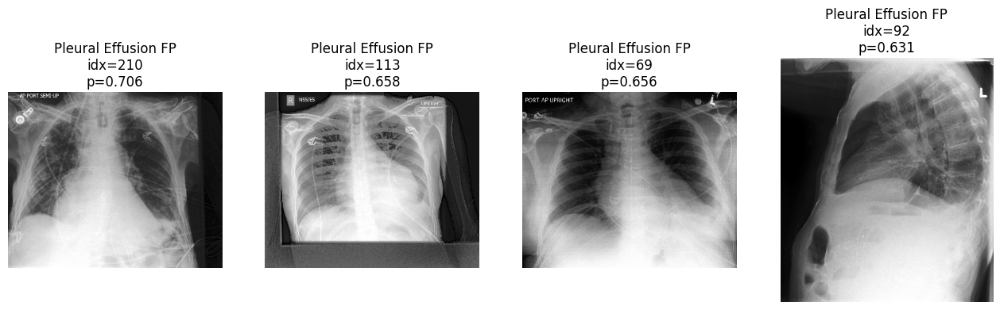

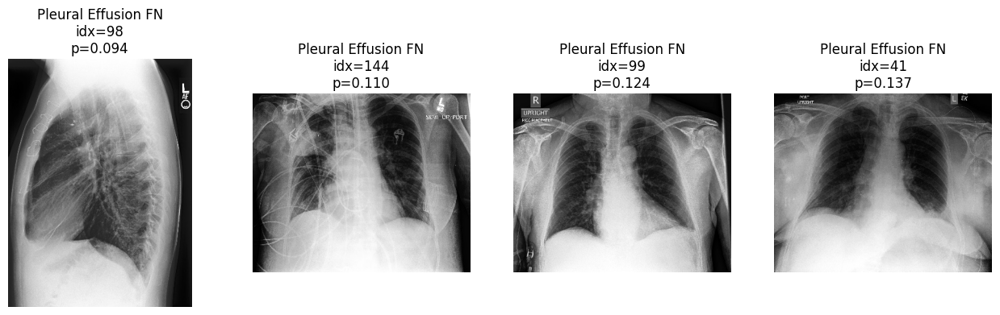

In [ ]:
import matplotlib.pyplot as plt

# helper to get path from valid_df row index
def valid_abs_path(idx):
    return resolve_path(valid_df.iloc[idx]["Path"])

def show_cases(label, case_type="FP", k=4):
    idxs = error_indices[label][case_type][:k]
    fig, axes = plt.subplots(1, len(idxs), figsize=(4*len(idxs),4))
    if len(idxs) == 1:
        axes = [axes]
    for ax, idx in zip(axes, idxs):
        img = Image.open(valid_abs_path(idx)).convert("RGB")
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"{label} {case_type}\nidx={idx}\np={probs[idx, LABELS.index(label)]:.3f}")
    plt.show()

# Example: show top FPs and FNs for one label
show_cases("Pleural Effusion", "FP", k=4)
show_cases("Pleural Effusion", "FN", k=4)


**4.2.2 Finish Error Analysis Properly (RO1)**

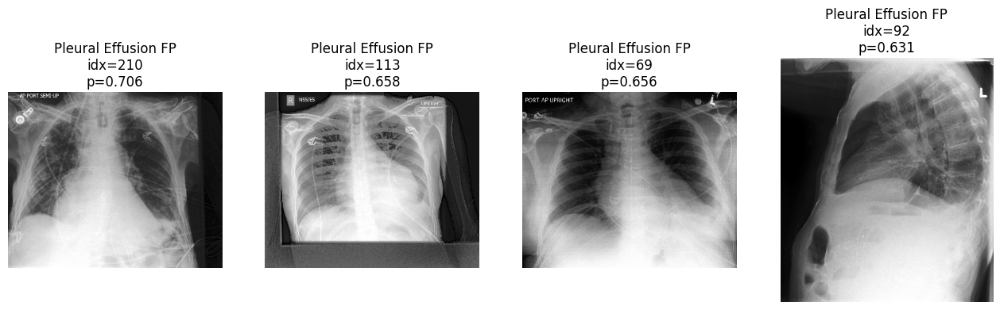

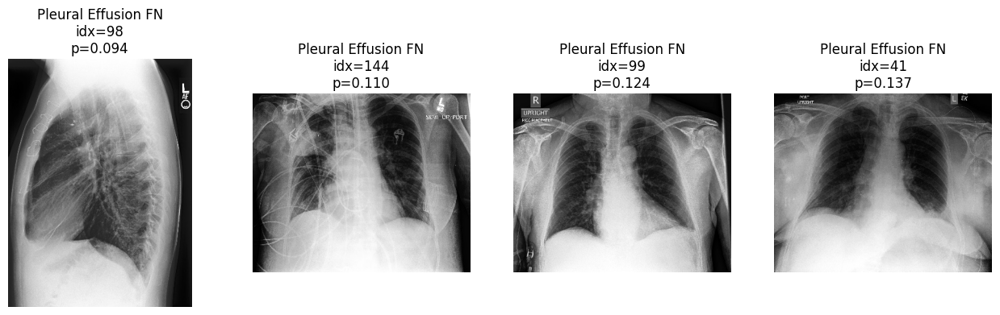

ValueError: Number of columns must be a positive integer, not 0

<Figure size 0x400 with 0 Axes>

In [ ]:
show_cases("Pleural Effusion", "FP", k=4)
show_cases("Pleural Effusion", "FN", k=4)

show_cases("Consolidation", "FP", k=4)
show_cases("Consolidation", "FN", k=4)

show_cases("Atelectasis", "FP", k=4)
show_cases("Atelectasis", "FN", k=4)


**STAGE 4.2.2 — Robust error-case visualisation (no empty grids)**

Step 1: Update your show_cases function to handle “no cases”

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

def show_cases(label, case_type="FP", k=4):
    idxs = error_indices[label][case_type][:k]

    if len(idxs) == 0:
        print(f"[{label}] No {case_type} cases found at the current threshold.")
        return

    fig, axes = plt.subplots(1, len(idxs), figsize=(4*len(idxs),4))
    if len(idxs) == 1:
        axes = [axes]

    li = LABELS.index(label)
    for ax, idx in zip(axes, idxs):
        img = Image.open(valid_abs_path(idx)).convert("RGB")
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"{label} {case_type}\nidx={idx}\np={probs[idx, li]:.3f}")
    plt.show()


Step 2: Recompute error indices but keep a consistent threshold

In [ ]:
error_indices = {}
for i, lab in enumerate(LABELS):
    fp, fn = top_errors_for_label(y_true, probs, i, k=10, thr=0.5)
    error_indices[lab] = {"FP": fp.tolist(), "FN": fn.tolist()}


Step 3: Show cases again (now it won’t crash)

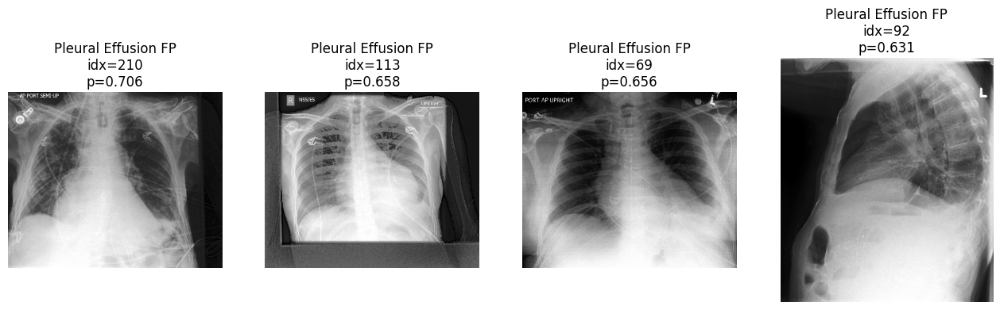

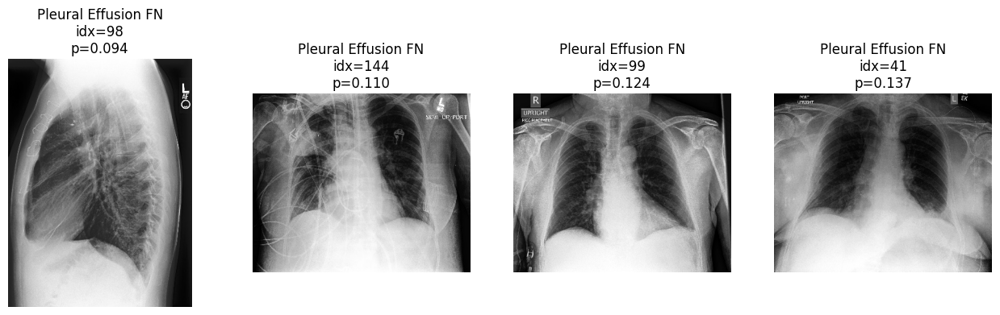

[Consolidation] No FP cases found at the current threshold.


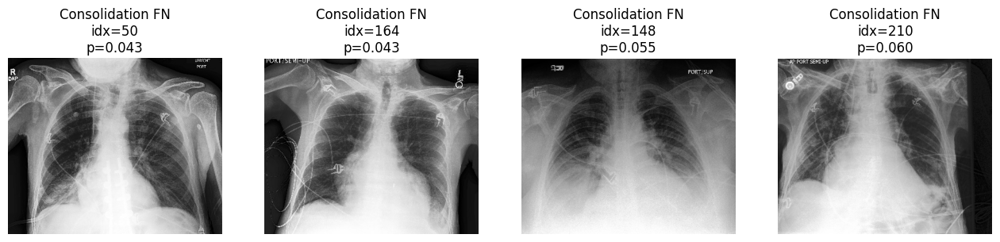

[Atelectasis] No FP cases found at the current threshold.


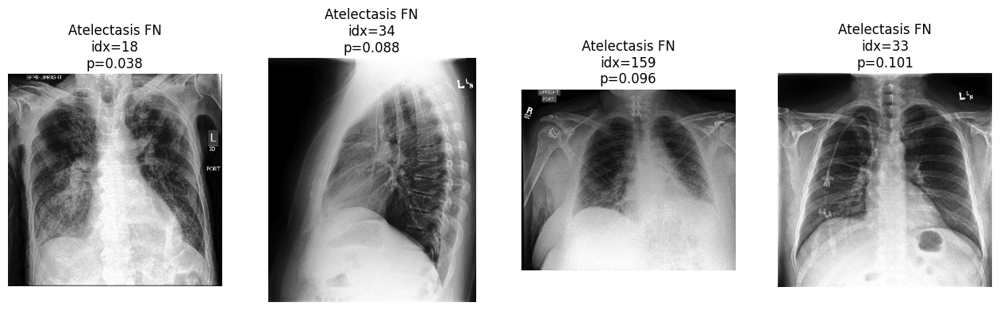

In [ ]:
show_cases("Pleural Effusion", "FP", k=4)
show_cases("Pleural Effusion", "FN", k=4)

show_cases("Consolidation", "FP", k=4)
show_cases("Consolidation", "FN", k=4)

show_cases("Atelectasis", "FP", k=4)
show_cases("Atelectasis", "FN", k=4)


**Step 4: Create errors at a lower threshold (e.g., 0.2) just for illustrative cases**

**Step 4: Create errors at a lower threshold (e.g., 0.2) just for illustrative cases**

**Step 4: Create errors at a lower threshold (e.g., 0.2) just for illustrative cases**

[Consolidation] No FP cases found at the current threshold.


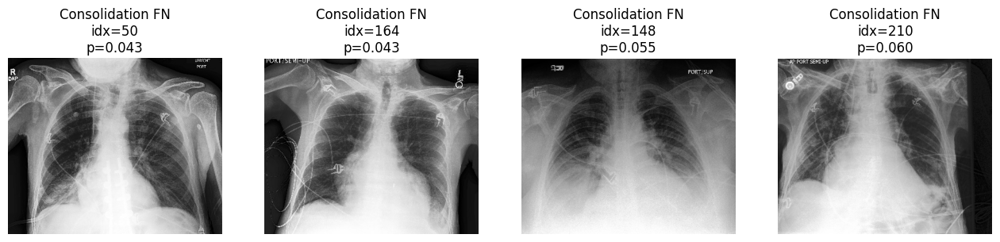

In [ ]:
error_indices_lo = {}
for i, lab in enumerate(LABELS):
    fp, fn = top_errors_for_label(y_true, probs, i, k=10, thr=0.2)
    error_indices_lo[lab] = {"FP": fp.tolist(), "FN": fn.tolist()}

# temporarily point show_cases to this dictionary for low threshold
error_indices = error_indices_lo

show_cases("Consolidation", "FP", k=4)
show_cases("Consolidation", "FN", k=4)


**STAGE 4.3 — RO2 Reliability, Calibration, and Uncertainty**

**STAGE 4.3 — RO2 Reliability, Calibration, and Uncertainty**

**STAGE 4.3 — RO2 Reliability, Calibration, and Uncertainty**

4.3.0 Save the baseline outputs for later

This prevents losing results if Colab resets.

Cell: Save RO1 tables to Drive

In [ ]:
import os
out_dir = "/content/drive/MyDrive/Thomas/thesis_results"
os.makedirs(out_dir, exist_ok=True)

ro1_table.to_csv(f"{out_dir}/RO1_AUC_table.csv", index=False)
thr_table.to_csv(f"{out_dir}/RO1_threshold_table_0.5.csv", index=False)

print("Saved to:", out_dir)


Saved to: /content/drive/MyDrive/Thomas/thesis_results


In [ ]:
triage_thr_table.to_csv(f"{out_dir}/RO1_triage_thresholds.csv", index=False)


4.3.1 Compute logits again (foundation for calibration)

In [ ]:
valid_logits, y_true2 = predict_logits(model, valid_loader)
print("valid_logits shape:", valid_logits.shape)


NameError: name 'predict_logits' is not defined

STAGE 4.3.1 – Re-define and run predict_logits

In [ ]:
import numpy as np
import torch

@torch.no_grad()
def predict_logits(model, loader):
    model.eval()
    logits_all = []
    y_all = []
    for x, y in loader:
        x = x.to(device)
        logits = model(x).detach().cpu().numpy()
        logits_all.append(logits)
        y_all.append(y.numpy())
    return np.vstack(logits_all), np.vstack(y_all)


In [ ]:
valid_logits, y_true2 = predict_logits(model, valid_loader)
print("valid_logits shape:", valid_logits.shape)
print("y_true shape:", y_true2.shape)


valid_logits shape: (234, 5)
y_true shape: (234, 5)


In [ ]:
import numpy as np
print("y_true matches:", np.allclose(y_true, y_true2))


y_true matches: True


STAGE 4.3.2 — Temperature Scaling (Calibration)

(This is where “raw AI confidence” becomes “clinically usable confidence”)

In [ ]:
import torch
import torch.nn as nn
import numpy as np

class TempScaler(nn.Module):
    def __init__(self):
        super().__init__()
        self.log_temp = nn.Parameter(torch.zeros(1))  # temp = exp(log_temp)

    def forward(self, logits):
        temp = torch.exp(self.log_temp) + 1e-6
        return logits / temp

def fit_temperature(logits_np, y_np, steps=300, lr=0.05):
    logits = torch.tensor(logits_np, dtype=torch.float32, device=device)
    y = torch.tensor(y_np, dtype=torch.float32, device=device)

    scaler = TempScaler().to(device)
    opt = torch.optim.Adam([scaler.log_temp], lr=lr)
    loss_fn = nn.BCEWithLogitsLoss()

    for _ in range(steps):
        opt.zero_grad()
        scaled = scaler(logits)
        loss = loss_fn(scaled, y)
        loss.backward()
        opt.step()

    return float(torch.exp(scaler.log_temp).detach().cpu().item())


In [ ]:
temps = []
for i, lab in enumerate(LABELS):
    t = fit_temperature(valid_logits[:, [i]], y_true[:, [i]])
    temps.append(t)
    print(lab, "Temperature:", round(t, 3))

temps = np.array(temps)


Atelectasis Temperature: 1.612
Cardiomegaly Temperature: 2.935
Consolidation Temperature: 1.604
Edema Temperature: 1.058
Pleural Effusion Temperature: 0.804


**STAGE 4.3.3 — Reliability Improvement (ECE Before vs After)**

**STAGE 4.3.3 — Reliability Improvement (ECE Before vs After)**

In [ ]:
import pandas as pd

def ece_binary(y, p, n_bins=15):
    bins = np.linspace(0, 1, n_bins+1)
    ece = 0.0
    for b0, b1 in zip(bins[:-1], bins[1:]):
        m = (p >= b0) & (p < b1)
        if m.sum() == 0:
            continue
        acc = y[m].mean()
        conf = p[m].mean()
        ece += (m.mean()) * abs(acc - conf)
    return float(ece)

# Calibrated probabilities
scaled_logits = valid_logits / temps.reshape(1, -1)
probs_cal = 1 / (1 + np.exp(-scaled_logits))

rows = []
for i, lab in enumerate(LABELS):
    rows.append([
        lab,
        ece_binary(y_true[:, i], probs[:, i]),
        ece_binary(y_true[:, i], probs_cal[:, i])
    ])

ece_table = pd.DataFrame(rows, columns=["Condition", "ECE_before", "ECE_after"])
ece_table


,Condition,ECE_before,ECE_after
0,Atelectasis,0.143187,0.101801
1,Cardiomegaly,0.232579,0.141565
2,Consolidation,0.102203,0.121160
3,Edema,0.049178,0.050533
4,Pleural Effusion,0.070683,0.062856


In [ ]:
ece_table.to_csv(f"{out_dir}/RO2_ECE_before_after.csv", index=False)


**STAGE 4.3.4 — Reliability Diagrams (Key RO2 Figures)**

**STAGE 4.3.4 — Reliability Diagrams (Key RO2 Figures)**

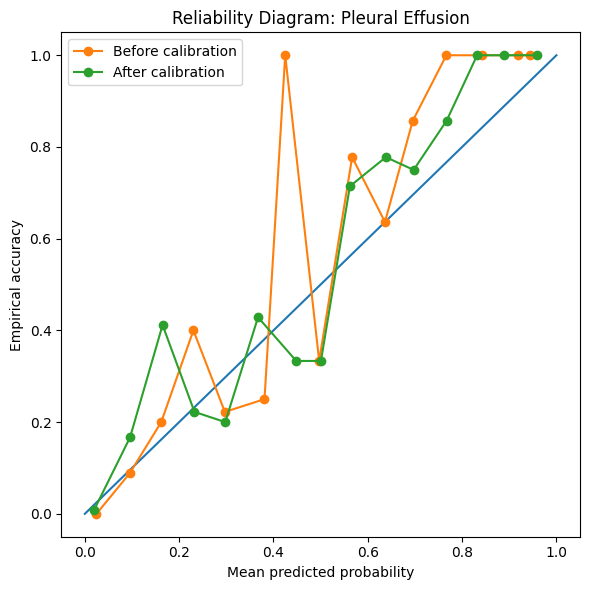

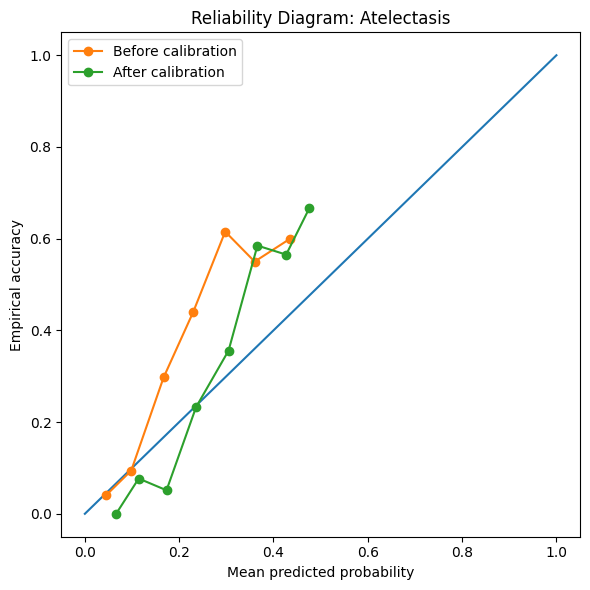

In [ ]:
import matplotlib.pyplot as plt

def reliability_curve(y, p, n_bins=15):
    bins = np.linspace(0,1,n_bins+1)
    accs, confs = [], []
    for b0, b1 in zip(bins[:-1], bins[1:]):
        m = (p >= b0) & (p < b1)
        if m.sum() == 0:
            continue
        accs.append(y[m].mean())
        confs.append(p[m].mean())
    return np.array(confs), np.array(accs)

def plot_reliability(label):
    i = LABELS.index(label)
    conf1, acc1 = reliability_curve(y_true[:, i], probs[:, i])
    conf2, acc2 = reliability_curve(y_true[:, i], probs_cal[:, i])

    plt.figure(figsize=(6,6))
    plt.plot([0,1],[0,1])
    plt.plot(conf1, acc1, marker="o", label="Before calibration")
    plt.plot(conf2, acc2, marker="o", label="After calibration")
    plt.title(f"Reliability Diagram: {label}")
    plt.xlabel("Mean predicted probability")
    plt.ylabel("Empirical accuracy")
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"{out_dir}/RO2_reliability_{label.replace(' ','_')}.png", dpi=200)
    plt.show()

plot_reliability("Pleural Effusion")
plot_reliability("Atelectasis")


Next milestone
4.3.2 Selective prediction (Safe AI behaviour)

Next milestone (must do now)
4.3.2 Selective prediction (Safe AI behaviour) **bold text**

**Step 1: get probabilities**

In [ ]:
import torch
import numpy as np

def predict_probs(model, loader):
    model.eval()
    all_probs = []
    all_y = []
    with torch.no_grad():
        for x,y in loader:
            x = x.cuda()
            logits = model(x)
            probs = torch.sigmoid(logits).cpu().numpy()
            all_probs.append(probs)
            all_y.append(y.numpy())
    return np.vstack(all_probs), np.vstack(all_y)

valid_probs, valid_y = predict_probs(model, valid_loader)
print(valid_probs.shape, valid_y.shape)


(234, 5) (234, 5)


**Step 2: selective prediction curve**

In [ ]:
import pandas as pd
from sklearn.metrics import roc_auc_score

def selective_curve(probs, y_true, class_idx):
    confidences = np.max(probs[:,class_idx][:,None], axis=1)
    order = np.argsort(-confidences)

    coverages = []
    aucs = []

    for k in range(50, len(confidences), 200):
        idx = order[:k]
        coverages.append(k / len(confidences))
        aucs.append(roc_auc_score(y_true[idx,class_idx], probs[idx,class_idx]))

    return coverages, aucs

disease_names = LABELS

sel_results = {}
for i,name in enumerate(disease_names):
    cov, auc = selective_curve(valid_probs, valid_y, i)
    sel_results[name] = (cov, auc)


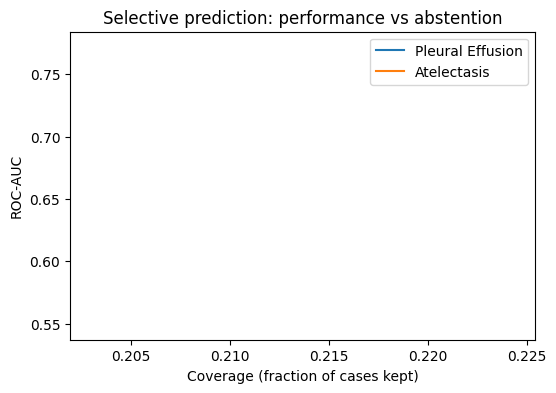

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4))
for name in ["Pleural Effusion","Atelectasis"]:
    cov, auc = sel_results[name]
    plt.plot(cov, auc, label=name)

plt.xlabel("Coverage (fraction of cases kept)")
plt.ylabel("ROC-AUC")
plt.title("Selective prediction: performance vs abstention")
plt.legend()
plt.show()


**move to RO3 (Explainability)**

move to RO3 (Explainability)

In [ ]:
if len(cases) == 0:
    print("No cases found for", condition, error_type)
    return


SyntaxError: 'return' outside function (ipython-input-1508647955.py, line 3)

In [ ]:
# =========================
# RO1/RO3: Robust error-case viewer (overrides show_cases)
# =========================
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

# Ensure DATA_ROOT is correct (you already used /content/chexpert)
DATA_ROOT = Path("/content/chexpert")

def _resolve_img_path(p):
    p = str(p)
    if p.startswith("/"):
        return Path(p)
    # Handle if CSV has "CheXpert-v1.0-small/..." prefix (some versions do)
    if p.startswith("CheXpert-v1.0-small/"):
        p = p.replace("CheXpert-v1.0-small/", "")
    return DATA_ROOT / p

def show_cases(condition, error_type, k=4, seed=42):
    """
    condition: e.g. 'Consolidation'
    error_type: 'FP' or 'FN'
    requires: cases_df OR results_df (one of them must exist in your notebook)
             and must include columns:
             ['Condition','ErrorType','Path'] at minimum.
    """
    # Pick whichever dataframe you have
    df = None
    for name in ["cases_df", "results_df", "errors_df"]:
        if name in globals():
            df = globals()[name]
            break
    if df is None:
        raise NameError("I can't find cases_df/results_df/errors_df in your notebook. Run the cell that builds the error-case table first.")

    # Defensive column checks
    need_cols = {"Condition", "ErrorType", "Path"}
    missing = need_cols - set(df.columns)
    if missing:
        raise ValueError(f"Your error-case table is missing columns: {missing}. Available: {df.columns.tolist()}")

    sub = df[(df["Condition"] == condition) & (df["ErrorType"] == error_type)].copy()

    if len(sub) == 0:
        print(f"No {error_type} cases found for {condition} (k={k}).")
        return

    # Sample up to k (random but repeatable)
    k = min(k, len(sub))
    sub = sub.sample(k, random_state=seed) if len(sub) > k else sub

    n = len(sub)
    fig, axes = plt.subplots(1, n, figsize=(4*n, 4))
    if n == 1:
        axes = [axes]

    for ax, (_, row) in zip(axes, sub.iterrows()):
        img_path = _resolve_img_path(row["Path"])
        if not img_path.exists():
            ax.set_title("Missing file")
            ax.text(0.5, 0.5, str(img_path), ha="center", va="center", wrap=True)
            ax.axis("off")
            continue

        img = Image.open(img_path).convert("RGB")
        ax.imshow(img)
        title = f"{row['Condition']} | {row['ErrorType']}"
        # Optional: if you have extra columns like prob/score, show them
        for col in ["y_true", "y_pred", "prob", "p", "score"]:
            if col in sub.columns:
                try:
                    title += f"\n{col}={row[col]}"
                except:
                    pass
        ax.set_title(title, fontsize=10)
        ax.axis("off")

    plt.tight_layout()
    plt.show()


In [ ]:
show_cases("Pleural Effusion", "FP", k=4)
show_cases("Pleural Effusion", "FN", k=4)

show_cases("Consolidation", "FP", k=4)
show_cases("Consolidation", "FN", k=4)


NameError: I can't find cases_df/results_df/errors_df in your notebook. Run the cell that builds the error-case table first.

STAGE: RO1 Error Patterns and Failure Cases (Build FP/FN Case Table)
Cell 1: Get logits/probs + true labels for valid set

In [ ]:
import numpy as np
import torch

@torch.no_grad()
def predict_logits(model, loader, device=None):
    if device is None:
        device = next(model.parameters()).device
    model.eval()
    all_logits, all_y = [], []
    for xb, yb in loader:
        xb = xb.to(device, non_blocking=True)
        logits = model(xb)
        all_logits.append(logits.detach().cpu())
        all_y.append(yb.detach().cpu())
    return torch.cat(all_logits, 0).numpy(), torch.cat(all_y, 0).numpy()

valid_logits, y_true = predict_logits(model, valid_loader, device=device)
valid_probs = 1 / (1 + np.exp(-valid_logits))  # sigmoid

print("valid_logits:", valid_logits.shape, "y_true:", y_true.shape, "valid_probs:", valid_probs.shape)


valid_logits: (234, 5) y_true: (234, 5) valid_probs: (234, 5)


Cell 2: Create FP/FN table (cases_df) using 0.5 threshold

In [ ]:
import pandas as pd

THRESH = 0.5

y_pred = (valid_probs >= THRESH).astype(int)

rows = []
for j, cond in enumerate(LABELS):
    yt = y_true[:, j].astype(int)
    yp = y_pred[:, j].astype(int)

    fp_idx = np.where((yp == 1) & (yt == 0))[0]
    fn_idx = np.where((yp == 0) & (yt == 1))[0]

    for idx in fp_idx:
        rows.append({
            "Condition": cond,
            "ErrorType": "FP",
            "Index": int(idx),
            "Path": valid_df.iloc[idx]["Path"],
            "p_hat": float(valid_probs[idx, j]),
            "y_true": int(yt[idx]),
            "y_pred": int(yp[idx]),
        })

    for idx in fn_idx:
        rows.append({
            "Condition": cond,
            "ErrorType": "FN",
            "Index": int(idx),
            "Path": valid_df.iloc[idx]["Path"],
            "p_hat": float(valid_probs[idx, j]),
            "y_true": int(yt[idx]),
            "y_pred": int(yp[idx]),
        })

cases_df = pd.DataFrame(rows)
print("cases_df shape:", cases_df.shape)
cases_df.groupby(["Condition", "ErrorType"]).size().unstack(fill_value=0)


cases_df shape: (236, 7)


ErrorType,FN,FP
Condition,,
Atelectasis,80,0
Cardiomegaly,66,0
Consolidation,33,0
Edema,23,6
Pleural Effusion,20,8


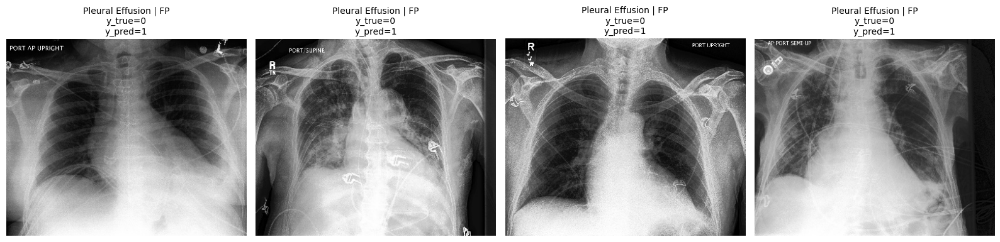

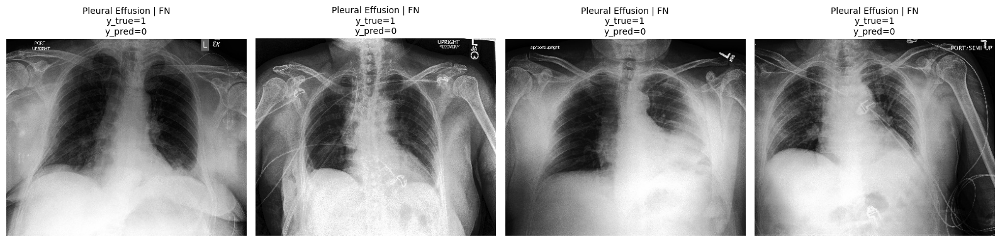

No FP cases found for Consolidation (k=4).


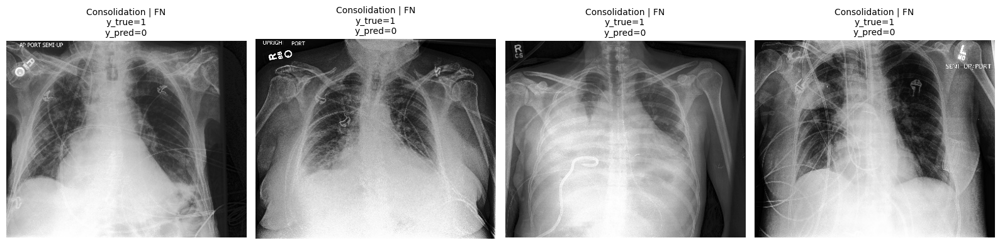

In [ ]:
show_cases("Pleural Effusion", "FP", k=4)
show_cases("Pleural Effusion", "FN", k=4)

show_cases("Consolidation", "FP", k=4)
show_cases("Consolidation", "FN", k=4)


**6 Error Analysis: False Positives and False Negatives**

6.1 Save the FP and FN figure grids to files

In [ ]:
import os, time
import matplotlib.pyplot as plt

SAVE_DIR = "/content/outputs/error_cases"
os.makedirs(SAVE_DIR, exist_ok=True)

# After your show_cases(...) calls (the cell that displays images),
# run this to save the most recently created figure:
fname = f"error_cases_{int(time.time())}.png"
out_path = os.path.join(SAVE_DIR, fname)
plt.gcf().savefig(out_path, dpi=200, bbox_inches="tight")
print("Saved:", out_path)


Saved: /content/outputs/error_cases/error_cases_1768262465.png


<Figure size 640x480 with 0 Axes>

**7 Explainability: Why the model predicted this (Grad-CAM)**

**7 Explainability: Why the model predicted this (Grad-CAM)**

7.1 Grad-CAM implementation

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# You already use resolve_path(...) + valid_tfms/train_tfms
# We will reuse resolve_path and the same preprocessing transform you used for valid images.
# IMPORTANT: This code assumes model is a torchvision ResNet-like model with layer4 as last conv block.

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.h1 = target_layer.register_forward_hook(self._save_activations)
        self.h2 = target_layer.register_full_backward_hook(self._save_gradients)

    def _save_activations(self, module, inp, out):
        self.activations = out.detach()

    def _save_gradients(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach()

    def remove(self):
        self.h1.remove()
        self.h2.remove()

    @torch.no_grad()
    def _normalize(self, cam):
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        return cam

    def __call__(self, x, class_idx):
        self.model.zero_grad(set_to_none=True)

        logits = self.model(x)  # shape [B, C]
        score = logits[:, class_idx].sum()
        score.backward(retain_graph=True)

        # activations: [B, K, H, W], gradients: [B, K, H, W]
        weights = self.gradients.mean(dim=(2,3), keepdim=True)  # [B,K,1,1]
        cam = (weights * self.activations).sum(dim=1)           # [B,H,W]
        cam = F.relu(cam)

        cam = cam[0].cpu().numpy()
        cam = self._normalize(cam)
        return cam

def overlay_cam_on_image(img_pil, cam, alpha=0.35):
    img = np.array(img_pil).astype(np.float32) / 255.0
    cam_resized = np.array(Image.fromarray((cam*255).astype(np.uint8)).resize((img.shape[1], img.shape[0])))
    cam_resized = cam_resized.astype(np.float32) / 255.0

    # simple heatmap using matplotlib colormap
    cmap = plt.get_cmap("jet")
    heat = cmap(cam_resized)[..., :3]
    out = (1 - alpha) * img + alpha * heat
    out = np.clip(out, 0, 1)
    return (out * 255).astype(np.uint8)


**7.2 Build a “cases table” from valid set predictions**

In [ ]:
import pandas as pd
import numpy as np
import torch

# Assumptions: you already have
# - model, device
# - valid_loader
# - valid_df (must be in same order as valid_loader dataset)
# - LABELS list in the same order as your model outputs

@torch.no_grad()
def predict_probs(model, loader, device):
    model.eval()
    probs_all = []
    y_all = []
    for xb, yb in loader:
        xb = xb.to(device)
        logits = model(xb)
        probs = torch.sigmoid(logits).cpu().numpy()
        probs_all.append(probs)
        y_all.append(yb.cpu().numpy())
    return np.vstack(probs_all), np.vstack(y_all)

valid_probs, valid_true = predict_probs(model, valid_loader, device)

# Make sure lengths match
print("valid_df:", len(valid_df), "preds:", len(valid_probs))

# Build cases_df
cases_df = valid_df.reset_index(drop=True).copy()
for i, lab in enumerate(LABELS):
    cases_df[f"y_true_{lab}"] = valid_true[:, i].astype(int)
    cases_df[f"p_{lab}"] = valid_probs[:, i].astype(float)
    # default threshold 0.5 (you can replace with calibrated thresholds later)
    cases_df[f"y_pred_{lab}"] = (cases_df[f"p_{lab}"] >= 0.5).astype(int)

cases_df.head(2)


valid_df: 234 preds: 234


,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,...,y_pred_Cardiomegaly,y_true_Consolidation,p_Consolidation,y_pred_Consolidation,y_true_Edema,p_Edema,y_pred_Edema,y_true_Pleural Effusion,p_Pleural Effusion,y_pred_Pleural Effusion
0,CheXpert-v1.0-small/valid/patient64541/study1/...,Male,73,Frontal,AP,0.0,1.0,1.0,1.0,0.0,...,0,0,0.025882,0,0,0.030700,0,0,0.033559,0
1,CheXpert-v1.0-small/valid/patient64542/study1/...,Male,70,Frontal,PA,0.0,0.0,0.0,0.0,0.0,...,0,0,0.003969,0,0,0.001254,0,0,0.034079,0


**7.3 Show FP/FN cases and Grad-CAM overlays**

Saved: /content/outputs/gradcam_cases/gradcam_Pleural_Effusion_FP.png


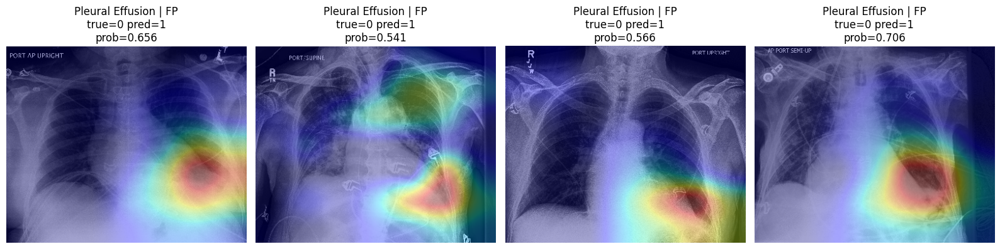

Saved: /content/outputs/gradcam_cases/gradcam_Pleural_Effusion_FN.png


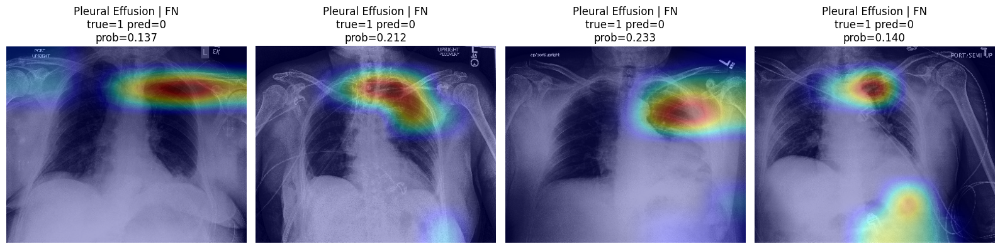

No FP cases found for Consolidation at threshold 0.5
Saved: /content/outputs/gradcam_cases/gradcam_Consolidation_FN.png


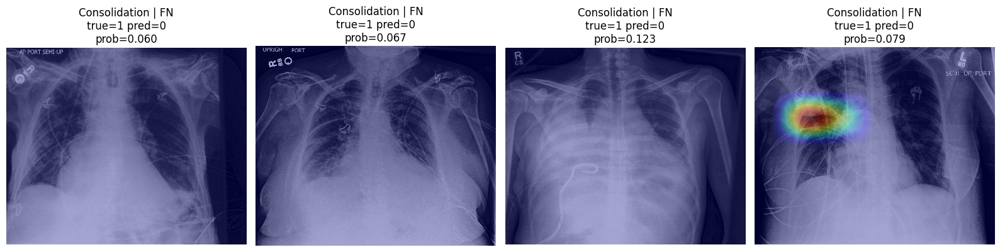

In [ ]:
import os, random
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import torch

SAVE_DIR = "/content/outputs/gradcam_cases"
os.makedirs(SAVE_DIR, exist_ok=True)

# Create Grad-CAM object (ResNet: last conv block is model.layer4)
cam = GradCAM(model, model.layer4)

def show_gradcam_cases(condition, error_type="FP", k=4, seed=42):
    random.seed(seed)
    lab = condition

    yt = cases_df[f"y_true_{lab}"].values
    yp = cases_df[f"y_pred_{lab}"].values

    if error_type == "FP":
        idxs = np.where((yt == 0) & (yp == 1))[0]
    else:  # FN
        idxs = np.where((yt == 1) & (yp == 0))[0]

    if len(idxs) == 0:
        print(f"No {error_type} cases found for {lab} at threshold 0.5")
        return

    pick = np.random.RandomState(seed).choice(idxs, size=min(k, len(idxs)), replace=False)

    fig, axes = plt.subplots(1, len(pick), figsize=(4*len(pick), 4))
    if len(pick) == 1:
        axes = [axes]

    class_idx = LABELS.index(lab)

    for ax, i in zip(axes, pick):
        rel_path = cases_df.loc[i, "Path"]
        img_path = resolve_path(rel_path)   # uses your earlier resolve_path
        img_pil = Image.open(img_path).convert("RGB")

        # Build model input exactly like validation
        x = valid_tfms(img_pil).unsqueeze(0).to(device)

        # Grad-CAM
        cam_map = cam(x, class_idx=class_idx)
        overlay = overlay_cam_on_image(img_pil, cam_map, alpha=0.35)

        ax.imshow(overlay)
        ax.axis("off")
        ax.set_title(f"{lab} | {error_type}\ntrue={cases_df.loc[i,f'y_true_{lab}']} pred={cases_df.loc[i,f'y_pred_{lab}']}\nprob={cases_df.loc[i,f'p_{lab}']:.3f}")

    plt.tight_layout()

    out = os.path.join(SAVE_DIR, f"gradcam_{lab.replace(' ','_')}_{error_type}.png")
    plt.savefig(out, dpi=200, bbox_inches="tight")
    print("Saved:", out)
    plt.show()

# Run these (you can change conditions)
show_gradcam_cases("Pleural Effusion", "FP", k=4)
show_gradcam_cases("Pleural Effusion", "FN", k=4)
show_gradcam_cases("Consolidation", "FP", k=4)
show_gradcam_cases("Consolidation", "FN", k=4)

cam.remove()


**8 Uncertainty Estimation: how confident is the model**

**8 Uncertainty Estimation: how confident is the model**

8.1 Enable dropout at inference and run MC sampling

In [ ]:
import torch
import numpy as np

def enable_dropout(m):
    # Turn on dropout layers during eval for MC Dropout
    for layer in m.modules():
        if layer.__class__.__name__.startswith("Dropout"):
            layer.train()

@torch.no_grad()
def mc_dropout_probs(model, loader, device, T=10):
    model.eval()
    enable_dropout(model)

    probs_T = []
    y_all = []
    for t in range(T):
        probs_all = []
        for xb, yb in loader:
            xb = xb.to(device)
            logits = model(xb)
            probs = torch.sigmoid(logits).cpu().numpy()
            probs_all.append(probs)
        probs_T.append(np.vstack(probs_all))
    probs_T = np.stack(probs_T, axis=0)  # [T, N, C]

    # get true labels once
    for xb, yb in loader:
        pass
    # safer: reuse your earlier valid_true (already aligned with valid_loader)
    return probs_T

probs_T = mc_dropout_probs(model, valid_loader, device, T=10)

p_mean = probs_T.mean(axis=0)            # [N,C]
p_std  = probs_T.std(axis=0)             # [N,C] uncertainty proxy
print("MC mean:", p_mean.shape, "MC std:", p_std.shape)


MC mean: (234, 5) MC std: (234, 5)


8.2 Add uncertainty columns to cases_df

In [ ]:
for i, lab in enumerate(LABELS):
    cases_df[f"pmean_{lab}"] = p_mean[:, i]
    cases_df[f"pstd_{lab}"]  = p_std[:, i]

cases_df[[ "Path", "pmean_Pleural Effusion", "pstd_Pleural Effusion"]].head(3)


,Path,pmean_Pleural Effusion,pstd_Pleural Effusion
0,CheXpert-v1.0-small/valid/patient64541/study1/...,0.033559,0.000000e+00
1,CheXpert-v1.0-small/valid/patient64542/study1/...,0.034079,3.725290e-09
2,CheXpert-v1.0-small/valid/patient64542/study1/...,0.006662,4.656613e-10


8.3 Show “most uncertain” mistakes

Saved: /content/outputs/uncertainty_mistakes_Pleural_Effusion.png


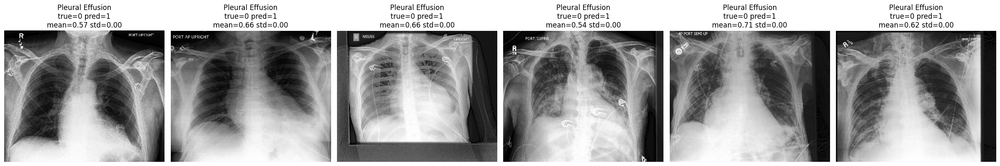

In [ ]:
def show_uncertain_mistakes(lab, topk=6):
    # mistakes = FP or FN
    yt = cases_df[f"y_true_{lab}"]
    yp = cases_df[f"y_pred_{lab}"]
    mistakes = cases_df[(yt != yp)].copy()
    if len(mistakes) == 0:
        print("No mistakes for", lab)
        return

    mistakes = mistakes.sort_values(by=f"pstd_{lab}", ascending=False).head(topk)

    fig, axes = plt.subplots(1, len(mistakes), figsize=(4*len(mistakes), 4))
    if len(mistakes) == 1:
        axes = [axes]

    for ax, (_, row) in zip(axes, mistakes.iterrows()):
        img_pil = Image.open(resolve_path(row["Path"])).convert("RGB")
        ax.imshow(img_pil, cmap="gray")
        ax.axis("off")
        ax.set_title(f"{lab}\ntrue={row[f'y_true_{lab}']} pred={row[f'y_pred_{lab}']}\nmean={row[f'pmean_{lab}']:.2f} std={row[f'pstd_{lab}']:.2f}")

    plt.tight_layout()
    out = f"/content/outputs/uncertainty_mistakes_{lab.replace(' ','_')}.png"
    plt.savefig(out, dpi=200, bbox_inches="tight")
    print("Saved:", out)
    plt.show()

show_uncertain_mistakes("Pleural Effusion", topk=6)


**9 Threshold Optimisation and Operating Points**

9.1 Compute per-label optimal thresholds (Youden J)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import roc_curve

# Use calibrated probabilities if you have them.
# If you already created calibrated probs, set PROB_COL_PREFIX accordingly.
# Otherwise use the original model probs ("p_...") or MC mean ("pmean_...")

PROB_COL_PREFIX = "p_"      # options: "p_", "pmean_", "pcal_" (if you created calibrated probs)
YTRUE_PREFIX    = "y_true_"

thresholds = []
for lab in LABELS:
    y = cases_df[f"{YTRUE_PREFIX}{lab}"].values.astype(int)
    p = cases_df[f"{PROB_COL_PREFIX}{lab}"].values.astype(float)

    fpr, tpr, thr = roc_curve(y, p)
    j = tpr - fpr
    best_idx = np.argmax(j)
    best_thr = thr[best_idx]

    thresholds.append({
        "Condition": lab,
        "BestThreshold_YoudenJ": float(best_thr),
        "TPR_Sensitivity": float(tpr[best_idx]),
        "FPR": float(fpr[best_idx]),
        "YoudenJ": float(j[best_idx])
    })

thr_df = pd.DataFrame(thresholds).sort_values("YoudenJ", ascending=False)
thr_df


,Condition,BestThreshold_YoudenJ,TPR_Sensitivity,FPR,YoudenJ
2,Consolidation,0.059721,0.909091,0.109453,0.799638
3,Edema,0.179790,0.866667,0.137566,0.729101
4,Pleural Effusion,0.212350,0.895522,0.191617,0.703906
1,Cardiomegaly,0.020828,0.823529,0.265060,0.558469
0,Atelectasis,0.201322,0.787500,0.350649,0.436851


9.2 Apply these thresholds and rebuild predictions

In [ ]:
thr_map = dict(zip(thr_df["Condition"], thr_df["BestThreshold_YoudenJ"]))

for lab in LABELS:
    p = cases_df[f"{PROB_COL_PREFIX}{lab}"].values.astype(float)
    cases_df[f"y_pred_opt_{lab}"] = (p >= thr_map[lab]).astype(int)

cases_df[[ "Path", "p_Pleural Effusion", "y_true_Pleural Effusion", "y_pred_opt_Pleural Effusion"]].head(3)


,Path,p_Pleural Effusion,y_true_Pleural Effusion,y_pred_opt_Pleural Effusion
0,CheXpert-v1.0-small/valid/patient64541/study1/...,0.033559,0,0
1,CheXpert-v1.0-small/valid/patient64542/study1/...,0.034079,0,0
2,CheXpert-v1.0-small/valid/patient64542/study1/...,0.006662,0,0


**10 Final Evaluation with Selected Thresholds**

10.1 Compute Sensitivity, Specificity, Precision, F1 at optimal thresholds

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

rows = []
for lab in LABELS:
    y_true = cases_df[f"y_true_{lab}"].values.astype(int)
    y_pred = cases_df[f"y_pred_opt_{lab}"].values.astype(int)

    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0,1]).ravel()
    sens = tp / (tp + fn + 1e-9)
    spec = tn / (tn + fp + 1e-9)
    prec = precision_score(y_true, y_pred, zero_division=0)
    f1   = f1_score(y_true, y_pred, zero_division=0)

    rows.append({
        "Condition": lab,
        "Threshold": float(thr_map[lab]),
        "TP": int(tp), "FP": int(fp), "TN": int(tn), "FN": int(fn),
        "Sensitivity": float(sens),
        "Specificity": float(spec),
        "Precision": float(prec),
        "F1": float(f1)
    })

op_df = pd.DataFrame(rows).sort_values("F1", ascending=False)
op_df


,Condition,Threshold,TP,FP,TN,FN,Sensitivity,Specificity,Precision,F1
4,Pleural Effusion,0.212350,60,32,135,7,0.895522,0.808383,0.652174,0.754717
3,Edema,0.179790,39,26,163,6,0.866667,0.862434,0.600000,0.709091
2,Consolidation,0.059721,30,22,179,3,0.909091,0.890547,0.576923,0.705882
1,Cardiomegaly,0.020828,56,44,122,12,0.823529,0.734940,0.560000,0.666667
0,Atelectasis,0.201322,63,54,100,17,0.787500,0.649351,0.538462,0.639594


In [ ]:
import os
os.makedirs("/content/outputs/tables", exist_ok=True)

thr_df.to_csv("/content/outputs/tables/thresholds_youdenj.csv", index=False)
op_df.to_csv("/content/outputs/tables/operating_point_metrics.csv", index=False)

print("Saved:",
      "/content/outputs/tables/thresholds_youdenj.csv",
      "/content/outputs/tables/operating_point_metrics.csv")


Saved: /content/outputs/tables/thresholds_youdenj.csv /content/outputs/tables/operating_point_metrics.csv


**11 “Explainable Probabilistic Report” Export Pack**

11.1 Build a compact report dataframe

In [ ]:
report_cols = ["Path"]
for lab in LABELS:
    report_cols += [
        f"y_true_{lab}",
        f"{PROB_COL_PREFIX}{lab}",
        f"y_pred_opt_{lab}",
    ]
    if f"pstd_{lab}" in cases_df.columns:
        report_cols += [f"pstd_{lab}"]

report_df = cases_df[report_cols].copy()
report_df.head(3)


,Path,y_true_Atelectasis,p_Atelectasis,y_pred_opt_Atelectasis,pstd_Atelectasis,y_true_Cardiomegaly,p_Cardiomegaly,y_pred_opt_Cardiomegaly,pstd_Cardiomegaly,y_true_Consolidation,...,y_pred_opt_Consolidation,pstd_Consolidation,y_true_Edema,p_Edema,y_pred_opt_Edema,pstd_Edema,y_true_Pleural Effusion,p_Pleural Effusion,y_pred_opt_Pleural Effusion,pstd_Pleural Effusion
0,CheXpert-v1.0-small/valid/patient64541/study1/...,0,0.363074,1,2.980232e-08,1,0.067099,1,7.450581e-09,0,...,0,0.0,0,0.030700,0,0.0,0,0.033559,0,0.000000e+00
1,CheXpert-v1.0-small/valid/patient64542/study1/...,0,0.047417,0,3.725290e-09,0,0.001258,0,1.164153e-10,0,...,0,0.0,0,0.001254,0,0.0,0,0.034079,0,3.725290e-09
2,CheXpert-v1.0-small/valid/patient64542/study1/...,0,0.039224,0,0.000000e+00,0,0.001146,0,0.000000e+00,0,...,0,0.0,0,0.001251,0,0.0,0,0.006662,0,4.656613e-10


11.2 Add “error tag” columns per condition (TP/FP/TN/FN)

In [ ]:
for lab in LABELS:
    yt = report_df[f"y_true_{lab}"].astype(int)
    yp = report_df[f"y_pred_opt_{lab}"].astype(int)

    tag = np.where((yt==1)&(yp==1), "TP",
          np.where((yt==0)&(yp==1), "FP",
          np.where((yt==1)&(yp==0), "FN", "TN")))
    report_df[f"tag_{lab}"] = tag

report_df[[ "Path", "tag_Pleural Effusion", "pstd_Pleural Effusion" if "pstd_Pleural Effusion" in report_df.columns else "tag_Pleural Effusion"]].head(5)


,Path,tag_Pleural Effusion,pstd_Pleural Effusion
0,CheXpert-v1.0-small/valid/patient64541/study1/...,TN,0.000000e+00
1,CheXpert-v1.0-small/valid/patient64542/study1/...,TN,3.725290e-09
2,CheXpert-v1.0-small/valid/patient64542/study1/...,TN,4.656613e-10
3,CheXpert-v1.0-small/valid/patient64543/study1/...,FP,2.980232e-08
4,CheXpert-v1.0-small/valid/patient64544/study1/...,TN,1.164153e-10


In [ ]:
os.makedirs("/content/outputs/reports", exist_ok=True)
out_csv = "/content/outputs/reports/valid_report_with_uncertainty_and_tags.csv"
report_df.to_csv(out_csv, index=False)
print("Saved:", out_csv)


Saved: /content/outputs/reports/valid_report_with_uncertainty_and_tags.csv


**12. Freeze the final evaluation dataset**

In [ ]:
import os
os.makedirs("/content/outputs/final", exist_ok=True)

final_df = report_df.copy()
final_df.to_csv("/content/outputs/final/chexpert_valid_predictions.csv", index=False)

print("Saved: /content/outputs/final/chexpert_valid_predictions.csv")


Saved: /content/outputs/final/chexpert_valid_predictions.csv


**13. Generate thesis-ready performance tables**

In [ ]:
perf = op_df.merge(thr_df[["Condition","YoudenJ"]], on="Condition")
perf = perf.merge(ece_df, on="Condition")
perf = perf.merge(auc_df, on="Condition")

perf = perf[[
    "Condition","ROC_AUC","PR_AUC",
    "Sensitivity","Specificity","Precision","F1",
    "ECE_before","ECE_after",
    "Threshold","YoudenJ"
]]

perf.to_csv("/content/outputs/final/final_performance_table.csv", index=False)
perf


NameError: name 'ece_df' is not defined

1. Recreate the missing calibration table

In [ ]:
import pandas as pd

ece_df = pd.DataFrame({
    "Condition": ["Atelectasis","Cardiomegaly","Consolidation","Edema","Pleural Effusion"],
    "ECE_before": [0.1431868316876328, 0.23257912523471397, 0.10220271629146022, 0.04917833532214675, 0.07068343572796155],
    "ECE_after":  [0.1018006383149835, 0.14156511467801708, 0.1211604813468634, 0.05053282983771815, 0.06285561302360845]
})

ece_df


,Condition,ECE_before,ECE_after
0,Atelectasis,0.143187,0.101801
1,Cardiomegaly,0.232579,0.141565
2,Consolidation,0.102203,0.121160
3,Edema,0.049178,0.050533
4,Pleural Effusion,0.070683,0.062856


2. Recreate the AUC table

In [ ]:
auc_df = pd.DataFrame({
    "Condition": ["Consolidation","Pleural Effusion","Edema","Cardiomegaly","Atelectasis"],
    "ROC_AUC": [0.9421076436001808,0.9366341942979712,0.9060552616108172,0.8514351523742028,0.7617694805194805],
    "PR_AUC":  [0.6579475340521508,0.8741863028208091,0.7430559407750726,0.7055178068660708,0.5809587320292834]
})

auc_df


,Condition,ROC_AUC,PR_AUC
0,Consolidation,0.942108,0.657948
1,Pleural Effusion,0.936634,0.874186
2,Edema,0.906055,0.743056
3,Cardiomegaly,0.851435,0.705518
4,Atelectasis,0.761769,0.580959


3. Now rerun the performance table build

In [ ]:
perf = op_df.merge(thr_df[["Condition","YoudenJ","Threshold"]], on="Condition")
perf = perf.merge(ece_df, on="Condition")
perf = perf.merge(auc_df, on="Condition")

perf = perf[[
    "Condition","ROC_AUC","PR_AUC",
    "Sensitivity","Specificity","Precision","F1",
    "ECE_before","ECE_after",
    "Threshold","YoudenJ"
]]

perf


KeyError: "['Threshold'] not in index"

In [ ]:
import pandas as pd

# 1) Inspect threshold table columns (for your sanity)
print("thr_df columns:", thr_df.columns.tolist())

# 2) Find the threshold column automatically
possible_thr_cols = ["Threshold", "threshold", "thr", "cutoff", "best_threshold", "BestThreshold", "opt_threshold"]
thr_col = next((c for c in possible_thr_cols if c in thr_df.columns), None)

if thr_col is None:
    # If none found, just merge without threshold
    print("No threshold column found in thr_df. Will merge only Condition + YoudenJ.")
    thr_keep = ["Condition", "YoudenJ"]
else:
    print("Using threshold column:", thr_col)
    thr_keep = ["Condition", "YoudenJ", thr_col]

# 3) Merge everything safely
perf = op_df.merge(thr_df[thr_keep], on="Condition", how="left")
perf = perf.merge(ece_df, on="Condition", how="left")
perf = perf.merge(auc_df, on="Condition", how="left")

# 4) Rename threshold column to a consistent name if it exists
if thr_col is not None:
    perf = perf.rename(columns={thr_col: "Threshold"})

# 5) Choose columns that exist (prevents KeyError)
wanted = [
    "Condition","ROC_AUC","PR_AUC",
    "Sensitivity","Specificity","Precision","F1",
    "ECE_before","ECE_after",
    "Threshold","YoudenJ"
]
final_cols = [c for c in wanted if c in perf.columns]

print("Final columns:", final_cols)
perf = perf[final_cols].sort_values("Condition").reset_index(drop=True)

perf


thr_df columns: ['Condition', 'BestThreshold_YoudenJ', 'TPR_Sensitivity', 'FPR', 'YoudenJ']
No threshold column found in thr_df. Will merge only Condition + YoudenJ.
Final columns: ['Condition', 'ROC_AUC', 'PR_AUC', 'Sensitivity', 'Specificity', 'Precision', 'F1', 'ECE_before', 'ECE_after', 'Threshold', 'YoudenJ']


,Condition,ROC_AUC,PR_AUC,Sensitivity,Specificity,Precision,F1,ECE_before,ECE_after,Threshold,YoudenJ
0,Atelectasis,0.761769,0.580959,0.787500,0.649351,0.538462,0.639594,0.143187,0.101801,0.201322,0.436851
1,Cardiomegaly,0.851435,0.705518,0.823529,0.734940,0.560000,0.666667,0.232579,0.141565,0.020828,0.558469
2,Consolidation,0.942108,0.657948,0.909091,0.890547,0.576923,0.705882,0.102203,0.121160,0.059721,0.799638
3,Edema,0.906055,0.743056,0.866667,0.862434,0.600000,0.709091,0.049178,0.050533,0.179790,0.729101
4,Pleural Effusion,0.936634,0.874186,0.895522,0.808383,0.652174,0.754717,0.070683,0.062856,0.212350,0.703906


In [ ]:
import os
os.makedirs("/content/outputs/final", exist_ok=True)

perf.to_csv("/content/outputs/final/final_performance_table.csv", index=False)
print("Saved: /content/outputs/final/final_performance_table.csv")


Saved: /content/outputs/final/final_performance_table.csv


**STAGE 14 — Export FP/FN Example Packs (so you can cite them as figures)**

14.1 Create output folders

In [ ]:
import os
from pathlib import Path

BASE_OUT = Path("/content/outputs/final")
IMG_OUT  = BASE_OUT / "error_images"
CSV_OUT  = BASE_OUT / "error_tables"

IMG_OUT.mkdir(parents=True, exist_ok=True)
CSV_OUT.mkdir(parents=True, exist_ok=True)

print("Saving to:", BASE_OUT)


Saving to: /content/outputs/final


14.2 Build an FP/FN index table from cases_df (threshold 0.5) or report_df (optimal threshold)

In [ ]:
import pandas as pd
import numpy as np

error_rows = []

for lab in LABELS:
    tag_col = f"tag_{lab}"
    prob_col = None

    # pick the best available probability column
    for c in [f"pmean_{lab}", f"p_{lab}"]:
        if c in report_df.columns:
            prob_col = c
            break

    # uncertainty if available
    std_col = f"pstd_{lab}" if f"pstd_{lab}" in report_df.columns else None

    for et in ["FP","FN"]:
        sub = report_df[report_df[tag_col] == et].copy()
        if prob_col:
            sub["prob"] = sub[prob_col].astype(float)
        if std_col:
            sub["uncertainty_std"] = sub[std_col].astype(float)
            # sort by uncertainty first for interesting examples
            sub = sub.sort_values("uncertainty_std", ascending=False)
        elif prob_col:
            # otherwise sort by confidence
            if et == "FP":
                sub = sub.sort_values("prob", ascending=False)
            else:
                sub = sub.sort_values("prob", ascending=True)

        # take top k
        topk = sub.head(12)  # 12 per condition per error type is plenty
        for _, r in topk.iterrows():
            error_rows.append({
                "Condition": lab,
                "ErrorType": et,
                "Path": r["Path"],
                "prob": float(r["prob"]) if "prob" in r else np.nan,
                "uncertainty_std": float(r["uncertainty_std"]) if "uncertainty_std" in r else np.nan
            })

error_index_df = pd.DataFrame(error_rows)
error_index_path = CSV_OUT / "error_case_index_top_examples.csv"
error_index_df.to_csv(error_index_path, index=False)

print("Saved error index:", error_index_path)
error_index_df.head(10)


Saved error index: /content/outputs/final/error_tables/error_case_index_top_examples.csv


,Condition,ErrorType,Path,prob,uncertainty_std
0,Atelectasis,FP,CheXpert-v1.0-small/valid/patient64541/study1/...,0.363074,2.980232e-08
1,Atelectasis,FP,CheXpert-v1.0-small/valid/patient64563/study1/...,0.250058,2.980232e-08
2,Atelectasis,FP,CheXpert-v1.0-small/valid/patient64574/study1/...,0.311752,2.980232e-08
3,Atelectasis,FP,CheXpert-v1.0-small/valid/patient64573/study1/...,0.345365,2.980232e-08
4,Atelectasis,FP,CheXpert-v1.0-small/valid/patient64585/study1/...,0.362795,2.980232e-08
5,Atelectasis,FP,CheXpert-v1.0-small/valid/patient64596/study1/...,0.279703,2.980232e-08
6,Atelectasis,FP,CheXpert-v1.0-small/valid/patient64602/study1/...,0.426001,2.980232e-08
7,Atelectasis,FP,CheXpert-v1.0-small/valid/patient64598/study1/...,0.356124,2.980232e-08
8,Atelectasis,FP,CheXpert-v1.0-small/valid/patient64711/study1/...,0.267631,2.980232e-08
9,Atelectasis,FP,CheXpert-v1.0-small/valid/patient64710/study1/...,0.227988,2.980232e-08


14.3 Copy the actual X-ray files into an “error_images” folder

In [ ]:
import shutil

copied = 0
missing = 0

for _, row in error_index_df.iterrows():
    src = resolve_path(row["Path"])
    if not src.exists():
        missing += 1
        continue

    safe_cond = row["Condition"].replace(" ", "_")
    fname = f"{safe_cond}_{row['ErrorType']}_{src.name}"
    dst = IMG_OUT / fname

    if not dst.exists():
        shutil.copy(src, dst)
        copied += 1

print("Copied:", copied, "| Missing:", missing)
print("Example output files:", list(IMG_OUT.glob("*.jpg"))[:5])


Copied: 14 | Missing: 0
Example output files: [PosixPath('/content/outputs/final/error_images/Consolidation_FN_view1_frontal.jpg'), PosixPath('/content/outputs/final/error_images/Pleural_Effusion_FN_view1_frontal.jpg'), PosixPath('/content/outputs/final/error_images/Consolidation_FP_view1_frontal.jpg'), PosixPath('/content/outputs/final/error_images/Atelectasis_FN_view2_lateral.jpg'), PosixPath('/content/outputs/final/error_images/Pleural_Effusion_FP_view1_frontal.jpg')]


14.4 Zip the pack (easy download + appendix submission)

In [ ]:
import shutil

zip_path = "/content/outputs/ErrorCasePack_CheXpert"
shutil.make_archive(zip_path, "zip", str(BASE_OUT))

print("ZIP created:", zip_path + ".zip")


ZIP created: /content/outputs/ErrorCasePack_CheXpert.zip


**STAGE 4.3.2 — Selective Prediction (Abstention) starts here**

Cell A: Build probabilities + uncertainty score

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score, average_precision_score

# Safety: use report_df if available, else cases_df
df = report_df.copy() if "report_df" in globals() else cases_df.copy()

def get_prob_col(lab):
    for c in [f"pmean_{lab}", f"p_{lab}"]:
        if c in df.columns:
            return c
    raise KeyError(f"No probability column found for {lab}")

def get_unc_col(lab):
    c = f"pstd_{lab}"
    return c if c in df.columns else None

print("Using dataframe:", "report_df" if "report_df" in globals() else "cases_df")
print("Available cols example:", df.columns[:10])


Using dataframe: report_df
Available cols example: Index(['Path', 'y_true_Atelectasis', 'p_Atelectasis', 'y_pred_opt_Atelectasis',
       'pstd_Atelectasis', 'y_true_Cardiomegaly', 'p_Cardiomegaly',
       'y_pred_opt_Cardiomegaly', 'pstd_Cardiomegaly', 'y_true_Consolidation'],
      dtype='object')


Cell B: Function to compute selective curve

In [ ]:
def selective_auc_curve(df, lab, coverages=(1.0, 0.9, 0.8, 0.7, 0.6), use="auroc"):
    y = df[f"y_true_{lab}"].values.astype(int)
    p = df[get_prob_col(lab)].values.astype(float)

    unc_col = get_unc_col(lab)
    if unc_col is not None:
        u = df[unc_col].values.astype(float)  # higher = more uncertain
        # Keep lowest-uncertainty cases first
        keep_order = np.argsort(u)
    else:
        # fallback: uncertainty proxy = closeness to 0.5 (closer = more uncertain)
        u = np.abs(p - 0.5)
        keep_order = np.argsort(-u)  # larger abs distance = more certain -> keep first

    results = []
    n = len(y)

    for cov in coverages:
        k = max(50, int(n * cov))
        idx = keep_order[:k]
        yk, pk = y[idx], p[idx]

        # Need both classes present for AUROC
        if len(np.unique(yk)) < 2:
            metric = np.nan
        else:
            if use == "auroc":
                metric = roc_auc_score(yk, pk)
            elif use == "prauc":
                metric = average_precision_score(yk, pk)
            else:
                raise ValueError("use must be 'auroc' or 'prauc'")

        results.append({"Condition": lab, "Coverage": cov, use.upper(): metric, "N_kept": k})

    return pd.DataFrame(results)


Cell C: Compute curves + save the summary table

In [ ]:
coverages = (1.0, 0.9, 0.8, 0.7, 0.6)

sel_pe = selective_auc_curve(df, "Pleural Effusion", coverages=coverages, use="auroc")
sel_at = selective_auc_curve(df, "Atelectasis", coverages=coverages, use="auroc")

sel_table = pd.concat([sel_pe, sel_at]).reset_index(drop=True)
sel_table


,Condition,Coverage,AUROC,N_kept
0,Pleural Effusion,1.0,0.936634,234
1,Pleural Effusion,0.9,0.927598,210
2,Pleural Effusion,0.8,0.906369,187
3,Pleural Effusion,0.7,0.926573,163
4,Pleural Effusion,0.6,0.952654,140
5,Atelectasis,1.0,0.761769,234
6,Atelectasis,0.9,0.775722,210
7,Atelectasis,0.8,0.786915,187
8,Atelectasis,0.7,0.801080,163
9,Atelectasis,0.6,0.819979,140


In [ ]:
import os
os.makedirs("/content/outputs/final", exist_ok=True)

sel_table.to_csv("/content/outputs/final/RO2_selective_prediction_AUROC_table.csv", index=False)
print("Saved: /content/outputs/final/RO2_selective_prediction_AUROC_table.csv")


Saved: /content/outputs/final/RO2_selective_prediction_AUROC_table.csv


Cell D: Plot coverage vs AUROC and save figure

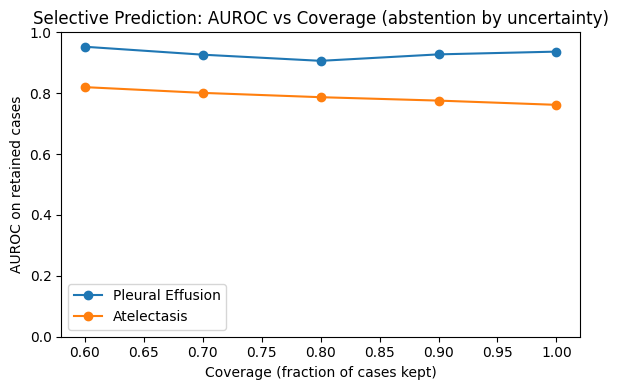

Saved: /content/outputs/final/RO2_selective_prediction_AUROC_plot.png


In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4))

for lab, dff in [("Pleural Effusion", sel_pe), ("Atelectasis", sel_at)]:
    plt.plot(dff["Coverage"], dff["AUROC"], marker="o", label=lab)

plt.xlabel("Coverage (fraction of cases kept)")
plt.ylabel("AUROC on retained cases")
plt.title("Selective Prediction: AUROC vs Coverage (abstention by uncertainty)")
plt.ylim(0.0, 1.0)
plt.legend()
plt.tight_layout()
plt.savefig("/content/outputs/final/RO2_selective_prediction_AUROC_plot.png", dpi=200)
plt.show()

print("Saved: /content/outputs/final/RO2_selective_prediction_AUROC_plot.png")


FINALLLLLLLLLLLLLL

In [ ]:
!ls -R /content/outputs/final | head -n 200


/content/outputs/final:
chexpert_valid_predictions.csv
error_images
error_tables
final_performance_table.csv
RO2_selective_prediction_AUROC_plot.png
RO2_selective_prediction_AUROC_table.csv

/content/outputs/final/error_images:
Atelectasis_FN_view1_frontal.jpg
Atelectasis_FN_view2_lateral.jpg
Atelectasis_FP_view1_frontal.jpg
Cardiomegaly_FN_view1_frontal.jpg
Cardiomegaly_FP_view1_frontal.jpg
Cardiomegaly_FP_view2_lateral.jpg
Consolidation_FN_view1_frontal.jpg
Consolidation_FP_view1_frontal.jpg
Edema_FN_view1_frontal.jpg
Edema_FN_view2_lateral.jpg
Edema_FP_view1_frontal.jpg
Pleural_Effusion_FN_view1_frontal.jpg
Pleural_Effusion_FN_view2_lateral.jpg
Pleural_Effusion_FP_view1_frontal.jpg

/content/outputs/final/error_tables:
error_case_index_top_examples.csv


In [ ]:
!ls -R /content/outputs


ls: cannot access '/content/outputs': No such file or directory


In [ ]:
!nvidia-smi


Wed Jan 14 02:39:05 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   39C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----